In [1]:
import sys
import xarray as xr
import torch
import random
import numpy as np
import torchinfo
import importlib as imp
import pandas as pd
import warnings

import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib as mpl
import cartopy as ct
import cmasher as cmr
import cartopy.feature as cfeature
import regionmask

# import cmaps as cmaps_ncl
import warnings

# import math

warnings.filterwarnings("ignore")

import utils
import datamaker.data_loader as data_loader
from datamaker.data_generator import ClimateData
from datamaker.data_generator_transfer import ClimateDataTransfer

import datamaker.regions as regions
from trainer.trainer import Trainer
from model.model import TorchModel
import model.loss as module_loss
import model.metric as module_metric
import visuals.plots as plots
from shash.shash_torch import Shash

print(f"python version = {sys.version}")
print(f"numpy version = {np.__version__}")
print(f"xarray version = {xr.__version__}")
print(f"pytorch version = {torch.__version__}")

# TODO: Pick up with storyline approach and check discrepancies in output_median and output_series_median
# device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# If I need to reload modules after loading in data
# %load_ext autoreload
# %autoreload 2
# %reload_ext autoreload

python version = 3.11.6 | packaged by conda-forge | (main, Oct  3 2023, 10:37:07) [Clang 15.0.7 ]
numpy version = 1.24.4
xarray version = 2023.6.0
pytorch version = 2.4.1


In [2]:
config_tf = utils.get_config("exp6001")
seed = config_tf["seed_list"][1]
seed

10

In [3]:
# Load the data; split into train, val, test
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)
torch.backends.cudnn.deterministic = True

print("getting data ...")
data_tf = ClimateDataTransfer(
    config_tf["datamaker"],
    expname=config_tf["expname"],
    seed=seed,
    data_dir=config_tf["data_dir"],
    figure_dir=config_tf["figure_dir"],
    verbose=False,
)

trainset_tf = data_loader.CustomData(data_tf.d_train)
valset_tf = data_loader.CustomData(data_tf.d_val)
testset_tf = data_loader.CustomData(data_tf.d_test)
obsset_tf = data_loader.CustomData(data_tf.d_obs)

getting data ...
YEAR REACHED:  [2001. 1998. 1990. 2000. 2014. 2003. 2007.]
YEAR REACHED:  [2007. 2004.]
YEAR REACHED:  [2012.]
(7, 251, 72, 144, 1)
(2, 251, 72, 144, 1)
(1, 251, 72, 144, 1)
YEAR REACHED:  [2009. 2002. 1994. 2004. 2014. 2003. 2007.]
YEAR REACHED:  [2007. 2004.]
YEAR REACHED:  [2012.]
(7, 251, 72, 144, 1)
(2, 251, 72, 144, 1)
(1, 251, 72, 144, 1)
YEAR REACHED:  [2016. 2013. 2016. 2002. 2013. 2021. 2008.]
YEAR REACHED:  [2005. 2008.]
YEAR REACHED:  [2014.]
(7, 251, 72, 144, 1)
(2, 251, 72, 144, 1)
(1, 251, 72, 144, 1)
YEAR REACHED:  [2026. 2021. 2017. 2002. 2013. 2021. 2015.]
YEAR REACHED:  [2012. 2011.]
YEAR REACHED:  [2014.]
(7, 251, 72, 144, 1)
(2, 251, 72, 144, 1)
(1, 251, 72, 144, 1)
YEAR REACHED:  [1987. 1999. 1992. 1997. 1995. 1994. 1993.]
YEAR REACHED:  [1996. 1998.]
YEAR REACHED:  [1999.]
(7, 251, 72, 144, 1)
(2, 251, 72, 144, 1)
(1, 251, 72, 144, 1)
YEAR REACHED:  [1990. 1999. 2001. 1997. 1995. 1998. 2003.]
YEAR REACHED:  [2005. 1998.]
YEAR REACHED:  [1999.]
(7

In [4]:
config_base = utils.get_config("exp905")
# seed = config_base["seed_list"][1]

print("getting data ...")
data = ClimateData(
    config_base["datamaker"],
    expname=config_base["expname"],
    seed=seed,
    data_dir=config_base["data_dir"],
    figure_dir=config_base["figure_dir"],
    verbose=False,
)

trainset_base = data_loader.CustomData(data.d_train)
valset_base = data_loader.CustomData(data.d_val)
testset_base = data_loader.CustomData(data.d_test)
obsset_base = data_loader.CustomData(data.d_obs)

getting data ...
YEAR REACHED:  [2001. 1998. 1990. 2000. 2014. 2003. 2007.]
(7, 251, 72, 144, 1)
YEAR REACHED:  [2007. 2004.]
(2, 251, 72, 144, 1)
YEAR REACHED:  [2012.]
(1, 251, 72, 144, 1)
(7, 251, 72, 144, 1)
(2, 251, 72, 144, 1)
(1, 251, 72, 144, 1)
YEAR REACHED:  [2009. 2002. 1994. 2004. 2014. 2003. 2007.]
(7, 251, 72, 144, 1)
YEAR REACHED:  [2007. 2004.]
(2, 251, 72, 144, 1)
YEAR REACHED:  [2012.]
(1, 251, 72, 144, 1)
(7, 251, 72, 144, 1)
(2, 251, 72, 144, 1)
(1, 251, 72, 144, 1)
YEAR REACHED:  [2026. 2017. 2017. 2004. 2016. 2003. 2007.]
(7, 251, 72, 144, 1)
YEAR REACHED:  [2028. 2004.]
(2, 251, 72, 144, 1)
YEAR REACHED:  [2017.]
(1, 251, 72, 144, 1)
(7, 251, 72, 144, 1)
(2, 251, 72, 144, 1)
(1, 251, 72, 144, 1)
YEAR REACHED:  [2036. 2037. 2048. 2022. 2058. 2029. 2034.]
(7, 251, 72, 144, 1)
YEAR REACHED:  [2038. 2035.]
(2, 251, 72, 144, 1)
YEAR REACHED:  [2038.]
(1, 251, 72, 144, 1)
(7, 251, 72, 144, 1)
(2, 251, 72, 144, 1)
(1, 251, 72, 144, 1)
YEAR REACHED:  [2100. 2083. 2100. 2

In [5]:
seed

10

In [6]:
# Load BASE model for prediction to store to compare with TF model predictions

# data_basemodel_predict = data_base

# Load the model
device = utils.prepare_device(config_base["device"])
model_name = utils.get_model_name(config_base["expname"], seed)
model_base = TorchModel(
    config=config_base["arch"], target=trainset_base.target
)  # sets up model architecture
model_base = utils.load_torch_model(
    model_base, config_base["model_dir"] + model_name + ".pt"
)  # loads model weights from file
model_base.to(device)  # sends model to GPU or CPU
print(f"loaded_model = {model_name}")

with torch.inference_mode():
    data.d_obs["output_base"] = model_base.predict(
        dataset=obsset_base, batch_size=128, device=device
    )

data.d_obs["output_median_basemodel_predict"] = (
    Shash(data.d_obs["output_base"]).median().numpy()
)
data.d_obs["output_lbar_basemodel_predict"] = (
    Shash(data.d_obs["output_base"]).quantile(0.25).numpy()
)
data.d_obs["output_hbar_basemodel_predict"] = (
    Shash(data.d_obs["output_base"]).quantile(0.75).numpy()
)

data.d_obs["output_mode_basemodel_predict"] = (
    Shash(data.d_obs["output_base"]).mode().numpy()
)
data.d_obs["output_mode_lbar_basemodel_predict"] = (
    Shash(data.d_obs["output_base"]).quantile(0.25).numpy()
)
data.d_obs["output_mode_hbar_basemodel_predict"] = (
    Shash(data.d_obs["output_base"]).quantile(0.75).numpy()
)

loaded_model = exp905_seed10


In [7]:
# Look at different data distributions
# import seaborn as sns

# data_tf.d_train["x"].shape

# for i in range(data_tf.d_train["x"].shape[-1]):  # Last dimension = features
#     sns.kdeplot(data_tf.d_train["x"][..., i].flatten(), label=f"Feature {i}", shade=True)
# plt.legend()
# plt.title("Feature-wise Distributions")
# plt.show()

# for i in range(data_tf.d_obs["x"].shape[-1]):  # Last dimension = features
#     sns.kdeplot(data_tf.d_obs["x"][..., i].flatten(), label=f"Feature {i}", shade=True)
# plt.legend()
# plt.title("Feature-wise Distributions")
# plt.show()

# for i in range(data_base.d_obs["x"].shape[-1]):  # Last dimension = features
#     sns.kdeplot(data_base.d_obs["x"][..., i].flatten(), label=f"Feature {i}", shade=True)
# plt.legend()
# plt.title("Feature-wise Distributions")
# plt.show()

In [8]:
device = utils.prepare_device(config_tf["device"])
# seed = config_tf["seed_list"][0]

model_name_base = utils.get_model_name(config_tf["expname_base"], seed)
model_name = model_name_base + "_tf" + config_tf["expname"] + "_transfer_learn"
model_tf = TorchModel(
    config=config_tf["arch"],
    target=trainset_base.target,
)  # sets up model architecture and keep the original target

model_tf = utils.load_torch_model(
    model_tf, config_tf["model_dir"] + model_name + ".pt"
)  # loads model weights from file
model_tf.to(device)  # sends model to GPU or CPU
model_tf.eval()  # sets model to evaluation mode
print(f"loaded_model = {model_name}")

loaded_model = exp905_seed10_tfexp6001_transfer_learn


In [9]:
# data = data_base

# Make predictions for train/val/test for GCM data
with torch.inference_mode():  # inference mode disables gradient calculations for efficiency
    data.d_train["output"] = model_tf.predict(
        dataset=trainset_base, batch_size=128, device=device
    )
    data.d_val["output"] = model_tf.predict(
        dataset=valset_base, batch_size=128, device=device
    )
    data.d_test["output"] = model_tf.predict(
        dataset=testset_base, batch_size=128, device=device
    )
    data.d_obs["output"] = model_tf.predict(
        dataset=obsset_base, batch_size=128, device=device
    )

data.d_train["output_median"] = Shash(data.d_train["output"]).median().numpy()
data.d_val["output_median"] = Shash(data.d_val["output"]).median().numpy()
data.d_test["output_median"] = Shash(data.d_test["output"]).median().numpy()

data.d_train["output_mode"] = Shash(data.d_train["output"]).mean().numpy()
data.d_val["output_mode"] = Shash(data.d_val["output"]).mode().numpy()
data.d_test["output_mode"] = Shash(data.d_test["output"]).mode().numpy()
# The data.d_train["output"] is a 4D array with the SHASH parameters
# Make predictions for obs

# with torch.inference_mode():
#     data.d_obs["output"] = model.predict(dataset=obsset, batch_size=128, device=device)

data.d_obs["output_median"] = Shash(data.d_obs["output"]).median().numpy()
data.d_obs["output_lbar"] = Shash(data.d_obs["output"]).quantile(0.25).numpy()
data.d_obs["output_hbar"] = Shash(data.d_obs["output"]).quantile(0.75).numpy()

data.d_obs["output_mode"] = Shash(data.d_obs["output"]).mode().numpy()
data.d_obs["output_mode_lbar"] = Shash(data.d_obs["output"]).quantile(0.25).numpy()
data.d_obs["output_mode_hbar"] = Shash(data.d_obs["output"]).quantile(0.75).numpy()

# predictions_obs = data.d_obs["output"]
# Print out some years relating to "threshold is reached" metrics
thresh_year = data.d_obs["output_median"] + data.d_obs["year"]
print("2024- Median Year Crossed " + str(thresh_year[-1]))
print(np.mean(thresh_year))
print(np.mean(thresh_year[-5:]))
print((data.d_obs["output_lbar"] + data.d_obs["year"])[-1])
print((data.d_obs["output_hbar"] + data.d_obs["year"])[-1])

2024- Median Year Crossed 2056.833263397217
2030.4062576154536
2055.1983963012694
2051.21319770813
2062.908832550049


In [10]:
# Print out some years relating to "threshold is reached" metrics
thresh_year = data.d_obs["output_mode"] + data.d_obs["year"]
print("2024- Maximum Likelihood Year Crossed " + str(thresh_year[-1]))
print(np.mean(thresh_year))
print(np.mean(thresh_year[-5:]))
print((data.d_obs["output_mode_lbar"] + data.d_obs["year"])[-1])
print((data.d_obs["output_mode_hbar"] + data.d_obs["year"])[-1])

constraint_var = "output_mode"

2024- Maximum Likelihood Year Crossed 2055.746026992798
2030.2780942331917
2054.088181304932
2051.21319770813
2062.908832550049


## Plot obs-constrained time to prediction

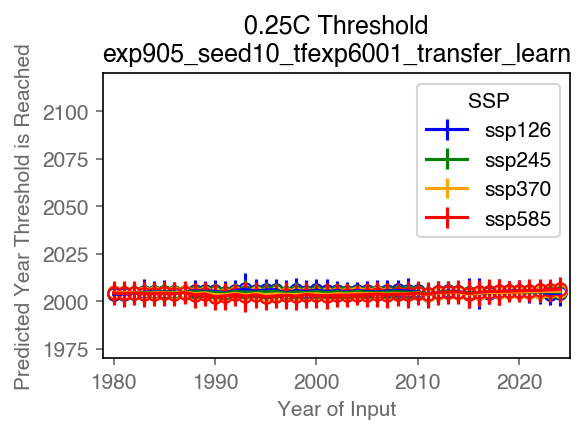

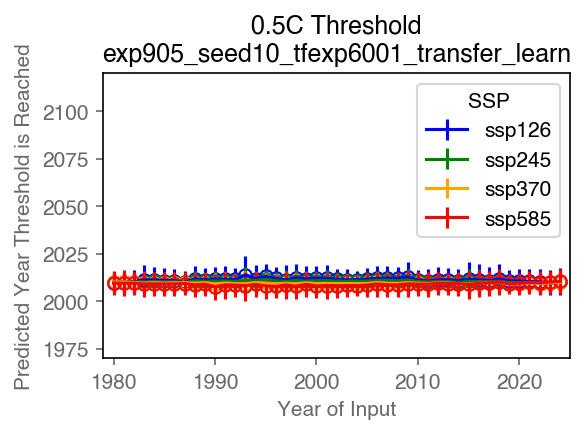

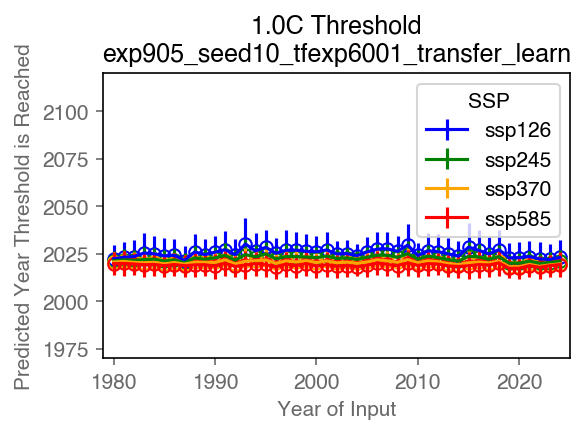

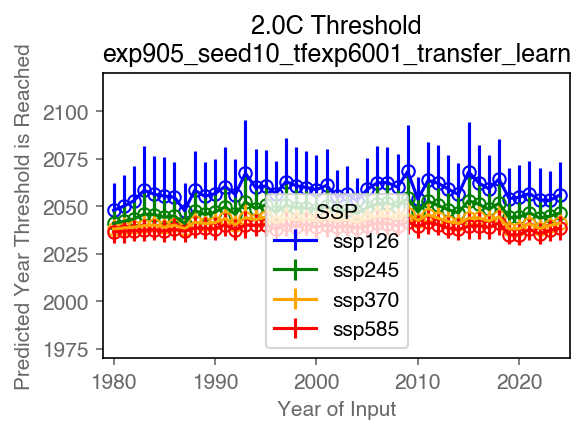

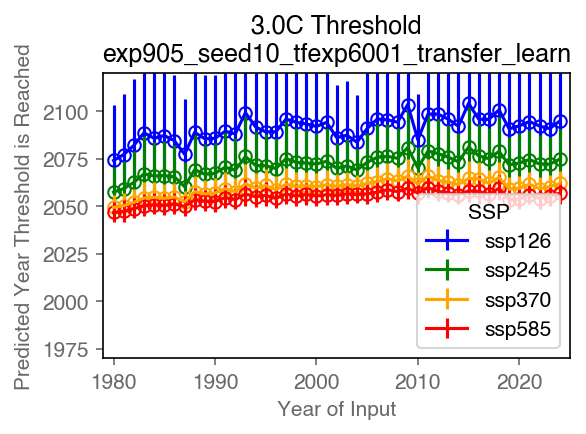

In [11]:
constraint_var = "output_median"

# Define colors for SSPs
colors = {
    "ssp126": "blue",
    "ssp245": "green",
    "ssp370": "orange",
    "ssp585": "red",
}

# Loop over temp_targets to create one plot for each
for temp_target in list(
    dict.fromkeys(data.d_obs["temp_target"])
):  # Unique temp_target values
    plt.figure(figsize=(4, 3))  # Create a new figure for each temp_target

    # Loop over SSPs to plot all lines for the current temp_target
    for ssp in list(dict.fromkeys(data.d_obs["ssp"])):  # Unique SSP values
        # Filter the dictionary to isolate data for the current SSP and temp_target
        indices = [
            i
            for i, (ssp_val, temp_tar) in enumerate(
                zip(data.d_obs["ssp"], data.d_obs["temp_target"])
            )
            if ssp_val == ssp and temp_tar == temp_target
        ]

        if not indices:  # Skip if no data matches the current combination
            continue

        # Extract relevant data for plotting
        years = [data.d_obs["year"][i] for i in indices]
        output_var = [data.d_obs[constraint_var][i] for i in indices]

        if constraint_var == "output_median":
            output_lbar = [data.d_obs["output_lbar"][i] for i in indices]
            output_hbar = [data.d_obs["output_hbar"][i] for i in indices]
            error_bars = np.concatenate(
                (
                    np.array(output_var) - np.array(output_lbar)[np.newaxis, :],
                    np.array(output_hbar)[np.newaxis, :] - np.array(output_var),
                ),
                axis=0,
            )
        else:
            output_lbar = [data.d_obs["output_mode_lbar"][i] for i in indices]
            output_hbar = [data.d_obs["output_mode_hbar"][i] for i in indices]
            # Compute error bars (ensure no negative values)
            lower_error = np.maximum(np.array(output_var) - np.array(output_lbar), 0)
            upper_error = np.maximum(np.array(output_hbar) - np.array(output_var), 0)

            # Make sure the error bars are in the shape of a 1D array
            error_bars = [lower_error, upper_error]

        # Plot the data with error bars
        plt.errorbar(
            years,
            np.array(output_var) + np.array(years),
            yerr=error_bars,
            color=colors[ssp],
            label=f"{ssp}",
        )

        # Plot the points
        plt.plot(
            years,
            np.array(output_var) + np.array(years),
            "o",
            markeredgecolor=colors[ssp],
            markersize=6,
            markerfacecolor="none",
            markeredgewidth=1,
        )

    # Set plot labels, legend, and limits
    plt.ylim(1970, 2120)
    plt.xlim(1979, 2025)
    plt.xlabel("Year of Input")
    plt.ylabel("Predicted Year Threshold is Reached")
    plt.title(f"{temp_target}C Threshold\n{model_name}")
    plt.legend(title="SSP", loc="best")
    plt.tight_layout()

    plt.savefig(
        f"{config_tf['figure_dir']}analysis/{config_tf['expname']}_temp_target_timeseries_{temp_target}_seed{seed}_transferlearn.png",
        dpi=300,
    )

    # Show the plot (or clear to start fresh for the next loop)
    plt.show()

## SHASH plots with obs

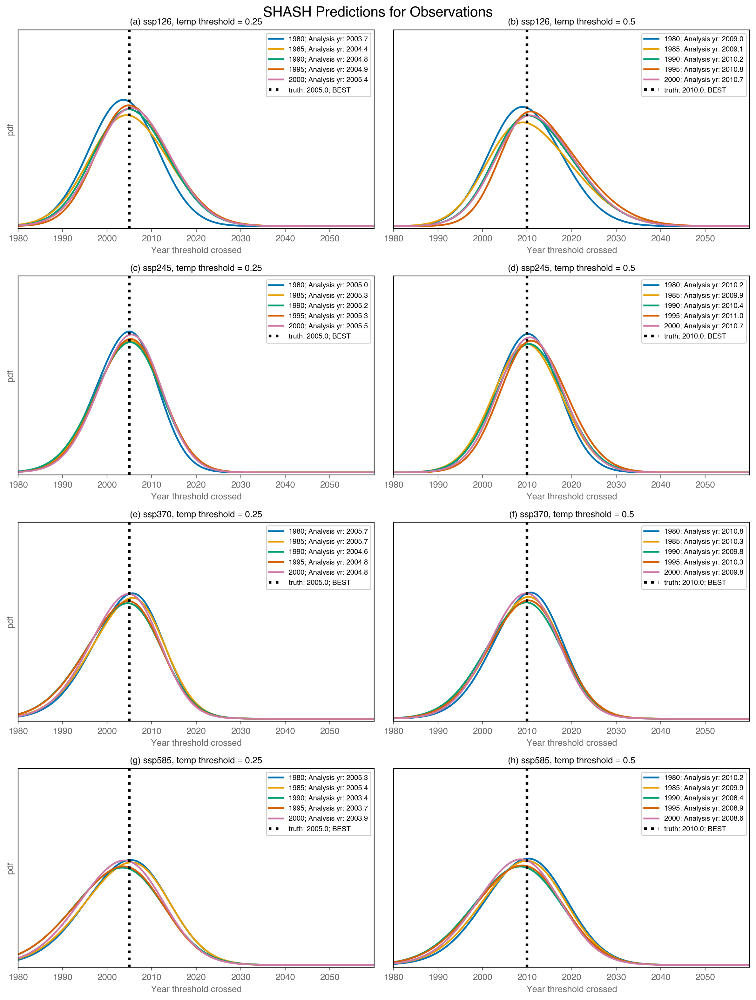

In [12]:
constraint_var = "output_mode"

# Temp targets that have been reached in OBS
temp_target_values = [0.25, 0.5]
years_of_interest = [1980, 1985, 1990, 1995, 2000]  # Years for SHASH predictions
ssp_plot_all = ["ssp126", "ssp245", "ssp370", "ssp585"]  # All SSPs to plot

x = np.arange(-130, 130, 0.1)  # X-axis for SHASH PDF
f, axs = plt.subplots(
    len(ssp_plot_all), len(temp_target_values), figsize=(12, 16), dpi=200
)  # SSPs x temp_target
panel_letters = ["(a)", "(b)", "(c)", "(d)", "(e)", "(f)", "(g)", "(h)"]
fontsize = 10

# Colorblind-friendly palette for years
color_palette = ["#0072B2", "#E69F00", "#009E73", "#D55E00", "#CC79A7"]

for i, ssp_plot in enumerate(ssp_plot_all):  # Loop through SSPs (rows)
    for j, temp_target in enumerate(
        temp_target_values
    ):  # Loop through temp_targets (columns)
        ax = axs[i, j]  # Select the correct subplot

        # Filter data for the current temp_target and SSP
        filtered_indices = [
            k
            for k, (tt, year, ssp) in enumerate(
                zip(data.d_obs["temp_target"], data.d_obs["year"], data.d_obs["ssp"])
            )
            if tt == temp_target and year in years_of_interest and ssp == ssp_plot
        ]

        if not filtered_indices:
            ax.text(
                0.5,
                0.5,
                "No data available",
                transform=ax.transAxes,
                fontsize=12,
                color="gray",
                ha="center",
                va="center",
            )
            continue

        # Plot SHASH curves for each year
        for color, year in zip(color_palette, years_of_interest):
            year_indices = [
                k for k in filtered_indices if data.d_obs["year"][k] == year
            ]

            if not year_indices:
                continue

            for sample in year_indices:
                dist = Shash(
                    data.d_obs["output"][sample : sample + 1, :]
                )  # SHASH for this sample
                p = dist.prob(x).numpy()
                ax.plot(
                    x
                    + data.d_obs["year"][sample],  # Shift x-axis by the prediction year
                    p,
                    zorder=1,
                    color=color,
                    linewidth=2,
                    label=f"{year}; Analysis yr: {data.d_obs[constraint_var][sample] + data.d_obs['year'][sample]:.1f}",
                )

        # Plot observations
        obs_indices = [
            k
            for k, (ssp_val, tt) in enumerate(
                zip(data.d_obs["ssp"], data.d_obs["temp_target"])
            )
            if ssp_val == ssp_plot and tt == temp_target
        ]

        if obs_indices:
            obs_index = obs_indices[0]
            obs_year = data.d_obs["y"][obs_index] + data.d_obs["year"][obs_index]
            gcm_name = data.d_obs["gcm_name"][obs_index]
            ax.axvline(
                x=obs_year,
                linestyle=":",
                color="black",
                alpha=1.0,
                linewidth=3,
                label=f"truth: {obs_year}; {gcm_name}",
                zorder=2,
            )
        else:
            ax.text(
                0.5,
                0.9,
                "truth: n/a",
                transform=ax.transAxes,
                fontsize=8,
                color="gray",
                ha="center",
            )

        # Customize subplot
        ax.set_title(
            panel_letters[i * 2 + j] + f" {ssp_plot}, temp threshold = {temp_target}",
            fontsize=fontsize,
            color="k",
        )

        ax.legend(
            fontsize=8, handlelength=2, frameon=True, loc="upper right", framealpha=1
        )
        ax.set_xlabel("Year threshold crossed", fontsize=fontsize)
        ax.set_xticks(np.arange(1980, 2060, 10))
        ax.set_xlim(1980, 2060)
        ax.set_ylim(-0.001, 0.08)

        ax.set_yticks([])
        ax.set_ylabel("pdf" if j == 0 else "")  # Y-label only for left column
        ax.grid(False)

plt.suptitle("SHASH Predictions for Observations", fontsize=16)
plt.tight_layout()
plt.savefig(
    f"{config_tf['figure_dir']}analysis/{config_tf['expname']}_shash_obs_based_seed{seed}_priorpreds_tflearn.png",
    dpi=300,
)
plt.show()

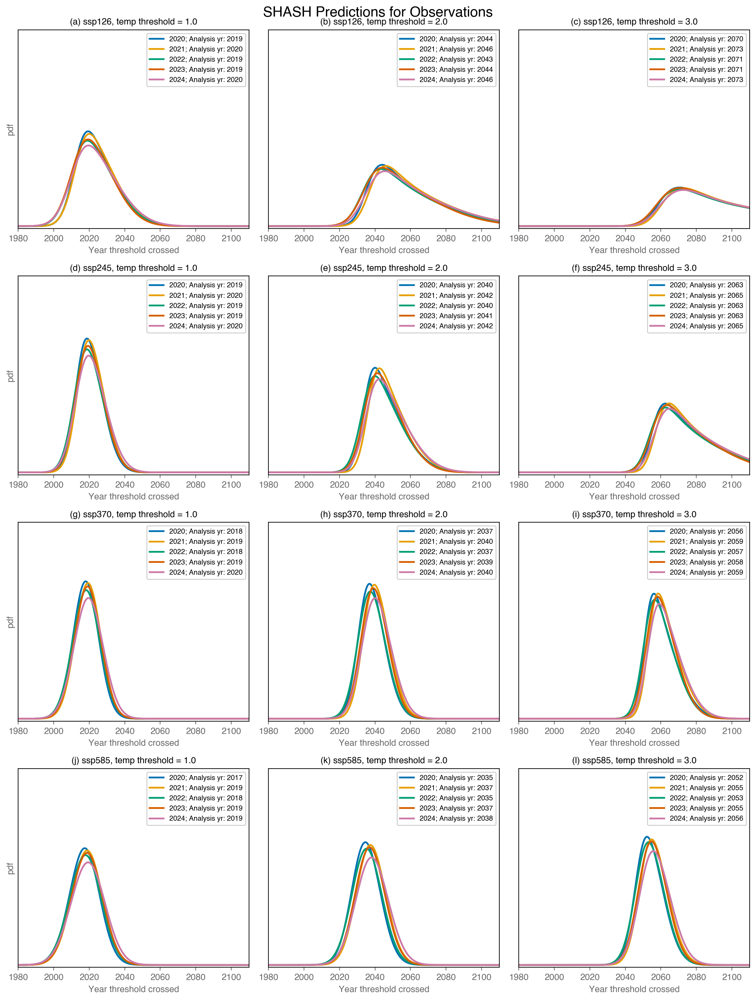

In [13]:
# Temp targets that haven't been reached in OBS
temp_target_values = [1.0, 2.0, 3.0]
years_of_interest = [2020, 2021, 2022, 2023, 2024]  # Years for SHASH predictions
ssp_plot_all = ["ssp126", "ssp245", "ssp370", "ssp585"]  # All SSPs to plot

x = np.arange(-130, 130, 0.1)  # X-axis for SHASH PDF
f, axs = plt.subplots(
    len(ssp_plot_all), len(temp_target_values), figsize=(12, 16), dpi=200
)  # SSPs x temp_target
panel_letters = [
    "(a)",
    "(b)",
    "(c)",
    "(d)",
    "(e)",
    "(f)",
    "(g)",
    "(h)",
    "(i)",
    "(j)",
    "(k)",
    "(l)",
]
fontsize = 10

# Colorblind-friendly palette for years
color_palette = ["#0072B2", "#E69F00", "#009E73", "#D55E00", "#CC79A7"]

for i, ssp_plot in enumerate(ssp_plot_all):  # Loop through SSPs (rows)
    for j, temp_target in enumerate(
        temp_target_values
    ):  # Loop through temp_targets (columns)
        ax = axs[i, j]  # Select the correct subplot

        # Filter data for the current temp_target and SSP
        filtered_indices = [
            k
            for k, (tt, year, ssp) in enumerate(
                zip(data.d_obs["temp_target"], data.d_obs["year"], data.d_obs["ssp"])
            )
            if tt == temp_target and year in years_of_interest and ssp == ssp_plot
        ]

        if not filtered_indices:
            ax.text(
                0.5,
                0.5,
                "No data available",
                transform=ax.transAxes,
                fontsize=12,
                color="gray",
                ha="center",
                va="center",
            )
            continue

        # Plot SHASH curves for each year
        for color, year in zip(color_palette, years_of_interest):
            year_indices = [
                k for k in filtered_indices if data.d_obs["year"][k] == year
            ]

            if not year_indices:
                continue

            for sample in year_indices:
                dist = Shash(
                    data.d_obs["output"][sample : sample + 1, :]
                )  # SHASH for this sample
                p = dist.prob(x).numpy()
                ax.plot(
                    x
                    + data.d_obs["year"][sample],  # Shift x-axis by the prediction year
                    p,
                    zorder=1,
                    color=color,
                    linewidth=2,
                    label=f"{year}; Analysis yr: {data.d_obs[constraint_var][sample] + data.d_obs['year'][sample]:.0f}",
                )

        # Plot observations
        obs_indices = [
            k
            for k, (ssp_val, tt) in enumerate(
                zip(data.d_obs["ssp"], data.d_obs["temp_target"])
            )
            if ssp_val == ssp_plot and tt == temp_target
        ]

        # if obs_indices:
        #     obs_index = obs_indices[0]
        #     obs_year = data.d_obs["y"][obs_index] + data.d_obs["year"][obs_index]
        #     gcm_name = data.d_obs["gcm_name"][obs_index]
        #     ax.axvline(
        #         x=obs_year,
        #         linestyle=":",
        #         color="black",
        #         alpha=1.0,
        #         linewidth=3,
        #         label=f"truth: {obs_year}; {gcm_name}",
        #         zorder=2,
        #     )
        # else:
        #     ax.text(
        #         0.5,
        #         0.9,
        #         "truth: n/a",
        #         transform=ax.transAxes,
        #         fontsize=8,
        #         color="gray",
        #         ha="center",
        #     )

        # Customize subplot
        ax.set_title(
            panel_letters[i * 3 + j] + f" {ssp_plot}, temp threshold = {temp_target}",
            fontsize=fontsize,
            color="k",
        )

        ax.legend(
            fontsize=8, handlelength=2, frameon=True, loc="upper right", framealpha=1
        )
        ax.set_xlabel("Year threshold crossed", fontsize=fontsize)
        ax.set_xticks(np.arange(1980, 2110, 20))
        ax.set_xlim(1980, 2110)
        ax.set_ylim(-0.001, 0.08)

        ax.set_yticks([])
        ax.set_ylabel("pdf" if j == 0 else "")  # Y-label only for left column
        ax.grid(False)

plt.suptitle("SHASH Predictions for Observations", fontsize=16)
plt.tight_layout()
plt.savefig(
    f"{config_tf['figure_dir']}analysis/{config_tf['expname']}_shash_obs_based_seed{seed}_recentpreds_tflearn.png",
    dpi=300,
)
plt.show()

# SHASH - GCMs only

In [14]:
# # Plot for Figure 2 of paper

# # Define the range of temp_target values
# temp_target_values = [2.0]
# ssp_plot = "ssp245"
# # temp_target_values = data.config["temp_targets"]

# x = np.arange(-130, 130, 0.1)
# f, axs = plt.subplots(1, 1, figsize=(4, 3), dpi=200)
# #axs = axs.flatten()

# # Colorblind-friendly palette
# colors = ["#009E73","#0072B2", "#E69F00", "#009E73", "#D55E00", "#CC79A7"]
# panel_letters = ("(a)", "(b)", "(c)", "(d)")
# fontsize = 10

# # Loop through each temp_target value for the panel plots
# for isample, temp_target in enumerate(temp_target_values):
#     ax = axs#[isample]

#     # Filter the data based on ssp and temp_target
#     filtered_indices = [
#         i
#         for i, (ssp, tt) in enumerate(
#             zip(data.d_test["ssp"], data.d_test["temp_target"])
#         )
#         if ssp == ssp_plot and tt == temp_target
#     ]

#     # Group the filtered data by unique gcm_name and sample one instance per GCM
#     #unique_gcms = set(data.d_test["gcm_name"][filtered_indices])
#     unique_gcms = {'ACCESS-ESM1-5'}

#     # Use a different color for each unique GCM
#     for color, gcm in zip(colors, unique_gcms):
#         # Find a sample corresponding to the current GCM
#         gcm_indices = [i for i in filtered_indices if data.d_test["gcm_name"][i] == gcm]
#         sample = gcm_indices[
#             45
#         ]  # Select a sample corresponding to this GCM - this can be updated to a storyline selection; 44 used for predictions made in 2023

#         # Plot the truth as a vertical line
#         truth_year = data.d_test["y"][sample] + data.d_test["year"][sample]
#         ax.axvline(
#             x=truth_year,
#             linestyle="--",
#             color=color,
#             alpha=1.0,
#             linewidth=4,
#             label=f"truth: {truth_year}",
#             zorder=0,
#         )

#         # Plot the SHASH distribution
#         dist = Shash(data.d_test["output"][sample : sample + 1, :])
#         p = dist.prob(x).numpy()
#         ax.plot(
#             x + data.d_test["year"][sample],
#             p,
#             zorder=1,
#             color=color,
#             linewidth=3,
#         )

#     # Customize the subplot
#     ax.set_title(
#         panel_letters[isample] + f" temp_target = {temp_target}",
#         fontsize=fontsize,
#         color="k",
#     )

#     # Add the legend for each subplot with fully opaque background
#     ax.legend(fontsize=8, handlelength=2, frameon=True, loc="upper right", framealpha=1)

#     ax.set_xlabel("year threshold crossed", fontsize=fontsize)
#     ax.set_xticks(np.arange(1980, 2110, 20))
#     ax.set_yticks(np.arange(0, 0.22, 0.02).round(2))
#     ax.set_xlim(1980, 2110)
#     ax.set_ylim(-0.001, 0.06)
#     plots.format_spines(ax)

#     ax.set_yticks([])
#     ax.set_ylabel("pdf")
#     ax.grid(False)

# plt.tight_layout()
# plt.savefig(
#     f"{config_tf['figure_dir']}analysis/{config_tf['expname']}_shash_gcm_{ssp}_transferlearn.png",
#     dpi=300,
# )

# plt.show()

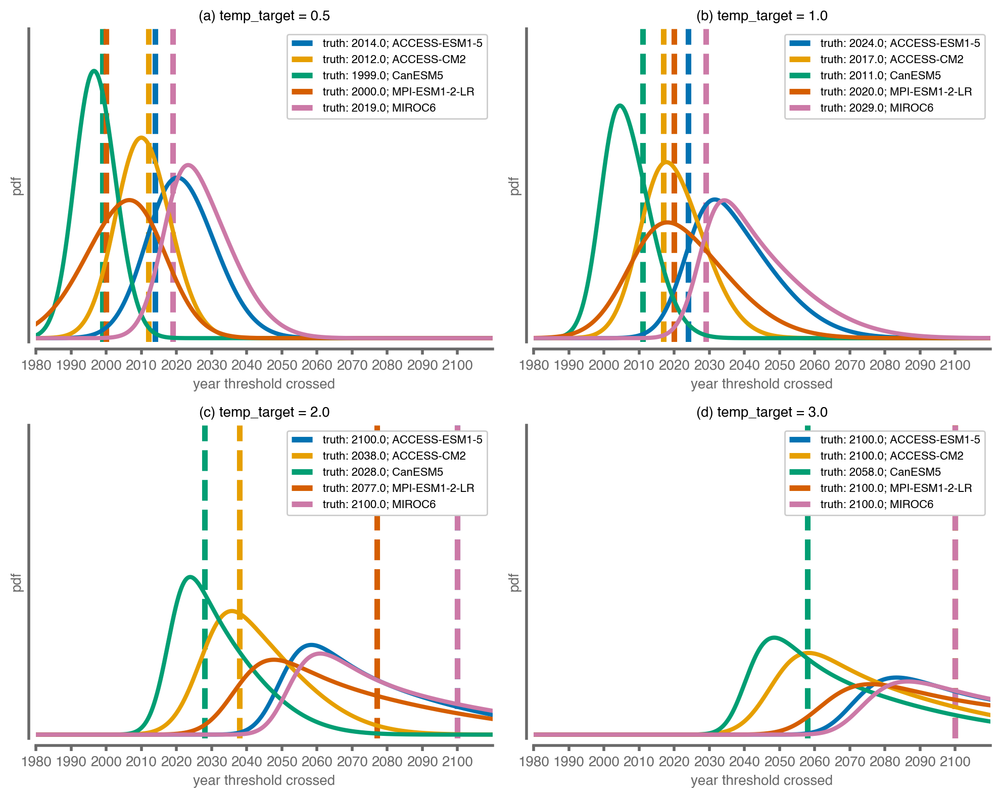

In [15]:
# SHASH plots

# Define the range of temp_target values
temp_target_values = [0.5, 1.0, 2.0, 3.0]
ssp_plot = "ssp126"
# temp_target_values = data.config["temp_targets"]

x = np.arange(-130, 130, 0.1)
f, axs = plt.subplots(2, 2, figsize=(10, 8), dpi=200)
axs = axs.flatten()

# Colorblind-friendly palette
colors = ["#0072B2", "#E69F00", "#009E73", "#D55E00", "#CC79A7"]
panel_letters = ("(a)", "(b)", "(c)", "(d)")
fontsize = 10

# Loop through each temp_target value for the panel plots
for isample, temp_target in enumerate(temp_target_values):
    ax = axs[isample]

    # Filter the data based on ssp and temp_target
    filtered_indices = [
        i
        for i, (ssp, tt) in enumerate(
            zip(data.d_test["ssp"], data.d_test["temp_target"])
        )
        if ssp == ssp_plot and tt == temp_target
    ]

    # Group the filtered data by unique gcm_name and sample one instance per GCM
    unique_gcms = set(data.d_test["gcm_name"][filtered_indices])

    # Use a different color for each unique GCM
    for color, gcm in zip(colors, unique_gcms):
        # Find a sample corresponding to the current GCM
        gcm_indices = [i for i in filtered_indices if data.d_test["gcm_name"][i] == gcm]
        sample = gcm_indices[
            44
        ]  # Select a sample corresponding to this GCM - this can be updated to a storyline selection; 44 used for predictions made in 2023

        # Plot the truth as a vertical line
        truth_year = data.d_test["y"][sample] + data.d_test["year"][sample]
        ax.axvline(
            x=truth_year,
            linestyle="--",
            color=color,
            alpha=1.0,
            linewidth=4,
            label=f"truth: {truth_year}; {gcm}",
            zorder=0,
        )

        # Plot the SHASH distribution
        dist = Shash(data.d_test["output"][sample : sample + 1, :])
        p = dist.prob(x).numpy()
        ax.plot(
            x + data.d_test["year"][sample],
            p,
            zorder=1,
            color=color,
            linewidth=3,
        )

    # Customize the subplot
    ax.set_title(
        panel_letters[isample] + f" temp_target = {temp_target}",
        fontsize=fontsize,
        color="k",
    )

    # Add the legend for each subplot with fully opaque background
    ax.legend(fontsize=8, handlelength=2, frameon=True, loc="upper right", framealpha=1)

    ax.set_xlabel("year threshold crossed", fontsize=fontsize)
    ax.set_xticks(np.arange(1980, 2110, 10))
    ax.set_yticks(np.arange(0, 0.22, 0.02).round(2))
    ax.set_xlim(1980, 2110)
    ax.set_ylim(-0.001, 0.08)
    plots.format_spines(ax)

    ax.set_yticks([])
    ax.set_ylabel("pdf")
    ax.grid(False)

plt.tight_layout()
plt.savefig(
    f"{config_tf['figure_dir']}analysis/{config_tf['expname']}_shash_gcm_{ssp}_transferlearn.png",
    dpi=300,
)

plt.show()

In [16]:
unique_gcms

{'ACCESS-CM2', 'ACCESS-ESM1-5', 'CanESM5', 'MIROC6', 'MPI-ESM1-2-LR'}

In [17]:
# Define the range of temp_target values
temp_target_values = [0.25, 0.5, 1.0, 2.0, 3.0]  # config["datamaker"]["temp_targets"] #
ssps = ["ssp126", "ssp245", "ssp370", "ssp585"]

x = np.arange(-130, 130, 0.1)

# Create a 4x4 grid (4 SSPS x 4 temp_target values)
fig, axs = plt.subplots(
    4, (len(temp_target_values)), figsize=(16, 16), dpi=600
)  # 4 rows, 4 columns
axs = axs.flatten()

# Colorblind-friendly palette
colors = ["#0072B2", "#E69F00", "#009E73", "#D55E00", "#CC79A7"]
fontsize = 10

# Loop through each ssp and temp_target combination for the panel plots
for i, ssp in enumerate(ssps):
    for j, temp_target in enumerate(temp_target_values):
        ax = axs[i * 5 + j]  # Set the position for the subplot

        # Filter the data based on ssp and temp_target
        filtered_indices = [
            k
            for k, (ssp_val, tt) in enumerate(
                zip(data.d_test["ssp"], data.d_test["temp_target"])
            )
            if ssp_val == ssp and tt == temp_target
        ]

        # Group the filtered data by unique gcm_name and sample one instance per GCM
        unique_gcms = set(data.d_test["gcm_name"][filtered_indices])

        # Use a different color for each unique GCM
        for color, gcm in zip(colors, unique_gcms):
            # Find a sample corresponding to the current GCM
            gcm_indices = [
                k for k in filtered_indices if data.d_test["gcm_name"][k] == gcm
            ]
            sample = gcm_indices[
                45
            ]  # 44 to correpsond with predictions made in 2023; 45 for 2024

            # Plot the truth as a vertical line
            truth_year = data.d_test["y"][sample] + data.d_test["year"][sample]
            ax.axvline(
                x=truth_year,
                linestyle="--",
                color=color,
                alpha=1.0,
                linewidth=4,
                label=f"truth: {truth_year}; {gcm}",
                zorder=0,
            )

            # Plot the SHASH distribution
            dist = Shash(data.d_test["output"][sample : sample + 1, :])
            p = dist.prob(x).numpy()
            ax.plot(
                x + data.d_test["year"][sample],
                p,
                zorder=1,
                color=color,
                linewidth=3,
            )

        # Customize the subplot
        ax.set_title(
            f"{ssp} - temp_target = {temp_target}", fontsize=fontsize, color="k"
        )

        # Add the legend for each subplot with fully opaque background
        ax.legend(
            fontsize=8, handlelength=2, frameon=True, loc="upper right", framealpha=1
        )

        ax.set_xlabel("year threshold crossed", fontsize=fontsize)
        ax.set_xticks(np.arange(1980, 2110, 20))
        ax.set_yticks(np.arange(0, 0.22, 0.02).round(2))
        ax.set_xlim(1980, 2110)
        ax.set_ylim(-0.001, 0.08)
        plots.format_spines(ax)

        ax.set_yticks([])
        ax.set_ylabel("pdf")
        ax.grid(False)

plt.tight_layout()
plt.savefig(
    f"{config_tf['figure_dir']}analysis/{config_tf['expname']}_shash_gcm_based_all_ssps_seed{seed}_transferlearn.png",
    dpi=300,
)
plt.show()

In [18]:
data_all = {
    key: np.concatenate([data.d_train[key], data.d_val[key], data.d_test[key]])
    for key in data.d_train.keys()
}

constraint_var = "output_mode"

from collections import defaultdict
import math

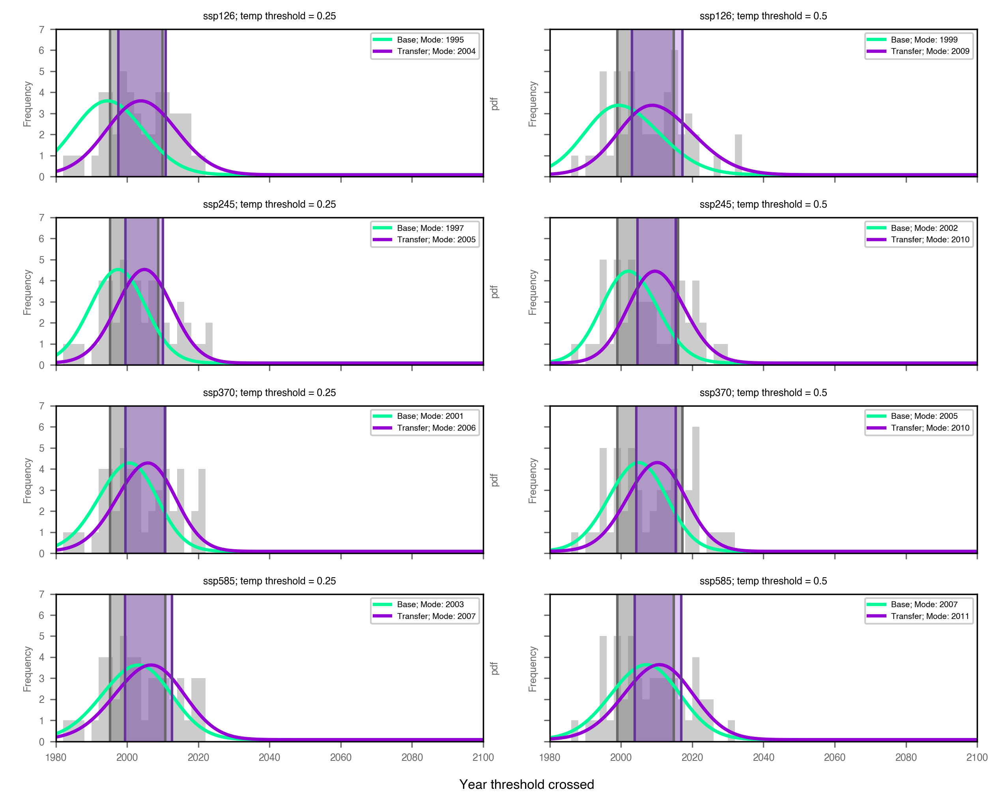

In [ ]:
from scipy.ndimage import gaussian_filter1d

# Configuration
temp_target_values = [1.0, 2.0, 3.0]
#temp_target_values = [0.25, 0.5]
ssps = ["ssp126", "ssp245", "ssp370", "ssp585"]  # "ssp126", "ssp245", "ssp370",


# temp_target_values = [3.0]
# ssps = ["ssp126"]  # "ssp126", "ssp245", "ssp370",

years_of_interest = [2024]  # Years for SHASH predictions
bins = np.arange(1980, 2101, 2)
x = np.arange(-130, 130, 0.1)  # X-axis for SHASH PDF
fontsize = 8

# This will hold the years for each (ssp, temp_target) group
grouped_years = defaultdict(list)

# Iterate through all data points in data_all
for idx in range(len(data_all["year_reached"])):
    ssp = data_all["ssp"][idx]
    temp_target = data_all["temp_target"][idx]
    gcm = data_all["gcm_name"][idx]
    member = data_all["member"][idx]
    year = data_all["year_reached"][idx]

    if ssp in ssps and temp_target in temp_target_values:
        key = (ssp, temp_target, gcm, member)  # Unique simulation
        grouped_years[key] = year  # Overwrites if duplicate (but should not happen)

# Now regroup by (ssp, temp_target) only
final_grouped = defaultdict(list)
for (ssp, temp_target, gcm, member), year in grouped_years.items():
    final_grouped[(ssp, temp_target)].append(year)

# Set up subplots
fig, axs = plt.subplots(
    len(ssps),
    len(temp_target_values),
    figsize=(9, 7),
    dpi=300,
    sharex=True,
    sharey=True,
    constrained_layout=True,
)

# Ensure 2D
if len(ssps) == 1 and len(temp_target_values) == 1:
    axs = np.array([[axs]])
elif len(ssps) == 1:
    axs = axs[np.newaxis, :]
elif len(temp_target_values) == 1:
    axs = axs[:, np.newaxis]

# Loop over SSP and temp_target
for i, ssp_plot in enumerate(ssps):
    for j, temp_target in enumerate(temp_target_values):
        ax = axs[i, j]
        ax2 = ax.twinx()
        key = (ssp_plot, temp_target)
        years = final_grouped.get(key, [])
        # print(key)
        # print(years)
        # Plot histogram
        ax.hist(years, bins=bins, color="silver", alpha=0.8)
        # Compute median and IQR
        median = np.median(years)
        q1 = np.percentile(years, 25)
        q3 = np.percentile(years, 75)

        # Plot IQR range as a horizontal bar
        ax.axvspan(q1, q3, color="grey", alpha=0.5, label="IQR")
        ax.axvline(q1, color="dimgray", linestyle="-", linewidth=1.5)
        ax.axvline(q3, color="dimgray", linestyle="-", linewidth=1.5)

        # Filter data for the current temp_target and SSP
        filtered_indices = [
            k
            for k, (tt, year, ssp) in enumerate(
                zip(data.d_obs["temp_target"], data.d_obs["year"], data.d_obs["ssp"])
            )
            if tt == temp_target and year in years_of_interest and ssp == ssp_plot
        ]

        # Plot SHASH curves for each year
        for color, year in zip(color_palette, years_of_interest):
            year_indices = [
                k for k in filtered_indices if data.d_obs["year"][k] == year
            ]

            if not year_indices:
                continue

            for sample in year_indices:
                dist = Shash(
                    data.d_obs["output_base"][sample : sample + 1, :]
                )  # SHASH for this sample
                p = dist.prob(x).numpy()
                ax2.plot(
                    x
                    + data.d_obs["year"][sample],  # Shift x-axis by the prediction year
                    p,
                    zorder=1,
                    color="mediumspringgreen",
                    linewidth=2.0,
                    label=f"Base; Mode: {data.d_obs['output_mode_basemodel_predict'][sample] + data.d_obs['year'][sample]:.0f}",
                )
                # ax2.axvline(x=data.d_obs["output_mode_basemodel_predict"][sample] + data.d_obs['year'][sample], linestyle="--", linewidth=4, color="black")
                ax2.set_ylim(-0.001, 0.08)

                ax2.set_yticks([])
                ax2.set_ylabel("pdf" if j == 0 else "")  # Y-label only for left column
                ax2.grid(False)

            for sample in year_indices:
                dist = Shash(
                    data.d_obs["output"][sample : sample + 1, :]
                )  # SHASH for this sample
                p = dist.prob(x).numpy()
                ax2.plot(
                    x
                    + data.d_obs["year"][sample],  # Shift x-axis by the prediction year
                    p,
                    zorder=1,
                    color="darkviolet",
                    linewidth=2.0,
                    label=f"Transfer; Mode: {data.d_obs[constraint_var][sample] + data.d_obs['year'][sample]:.0f}",
                )
                # ax2.axvline(x=data.d_obs[constraint_var][sample] + data.d_obs['year'][sample], linestyle="--", linewidth=4, color='darkviolet')
                ax2.axvline(
                    x=data.d_obs["output_lbar"][sample] + data.d_obs["year"][sample],
                    linestyle="-",
                    linewidth=1.5,
                    color="rebeccapurple",
                )
                ax2.axvline(
                    x=data.d_obs["output_hbar"][sample] + data.d_obs["year"][sample],
                    linestyle="-",
                    linewidth=1.5,
                    color="rebeccapurple",
                )
                ax.axvspan(
                    data.d_obs["output_lbar"][sample] + data.d_obs["year"][sample],
                    data.d_obs["output_hbar"][sample] + data.d_obs["year"][sample],
                    color="blueviolet",
                    alpha=0.25,
                    label="IQR CNN-Transfer",
                )

                ax2.set_ylim(-0.001, 0.08)
                ax2.set_xlabel("Year threshold crossed", fontsize=fontsize)

                ax2.set_yticks([])
                ax2.set_ylabel(
                    "pdf" if j == 0 else "", fontsize=6
                )  # Y-label only for left column
                ax2.grid(False)

                if j == 2:
                    ax2.legend(
                        fontsize=5,
                        handlelength=2,
                        frameon=True,
                        loc="upper left",
                        framealpha=1,
                    )
                else:
                    ax2.legend(
                        fontsize=5,
                        handlelength=2,
                        frameon=True,
                        loc="upper right",
                        framealpha=1,
                    )

            # min, ymax = ax.get_ylim()

        # Titles and labels
        ax.set_title(f"{ssp_plot}; temp threshold = {temp_target}", fontsize=6)
        ax.set_ylabel(f"\nFrequency", fontsize=6)
        ax.set_xticks(np.arange(1980, 2110, 20))
        ax.set_xlim(1980, 2100)
        ax.set_ylim(0, 7)
        ax.set_yticks(np.arange(0, 8, 1))
        ax.tick_params(axis="both", labelsize=6)
        ax2.tick_params(axis="both", labelsize=6)

        # # Optional: remove top/right spines
        # ax.spines['top'].set_visible(False)
        # ax.spines['right'].set_visible(False)

# Add shared X label
fig.text(0.5, 0.04, "Year threshold crossed", ha="center", fontsize=8)

# Adjust layout
plt.tight_layout(rect=[0, 0.05, 0.95, 1])
plt.show()

# Storylines

In [20]:
# If I need to reload modules after loading in data
%load_ext autoreload
%autoreload 2
%reload_ext autoreload

import analysis

Computing anomalies with reference to baseline_yr_bounds then anomaly_yr_bounds.
Computing anomalies with reference to baseline_yr_bounds then anomaly_yr_bounds.
Computing anomalies with reference to baseline_yr_bounds then anomaly_yr_bounds.
Computing anomalies with reference to baseline_yr_bounds then anomaly_yr_bounds.
Computing anomalies with reference to baseline_yr_bounds then anomaly_yr_bounds.
Computing anomalies with reference to baseline_yr_bounds then anomaly_yr_bounds.
Computing anomalies with reference to baseline_yr_bounds then anomaly_yr_bounds.
Computing anomalies with reference to baseline_yr_bounds then anomaly_yr_bounds.
Computing anomalies with reference to baseline_yr_bounds then anomaly_yr_bounds.
Computing anomalies with reference to baseline_yr_bounds then anomaly_yr_bounds.
Skipping ACCESS-ESM1-5 member 3 in ssp126 due to year_reached=2100.0
Skipping ACCESS-ESM1-5 member 1 in ssp126 due to year_reached=2100.0
Skipping ACCESS-ESM1-5 member 7 in ssp126 due to yea

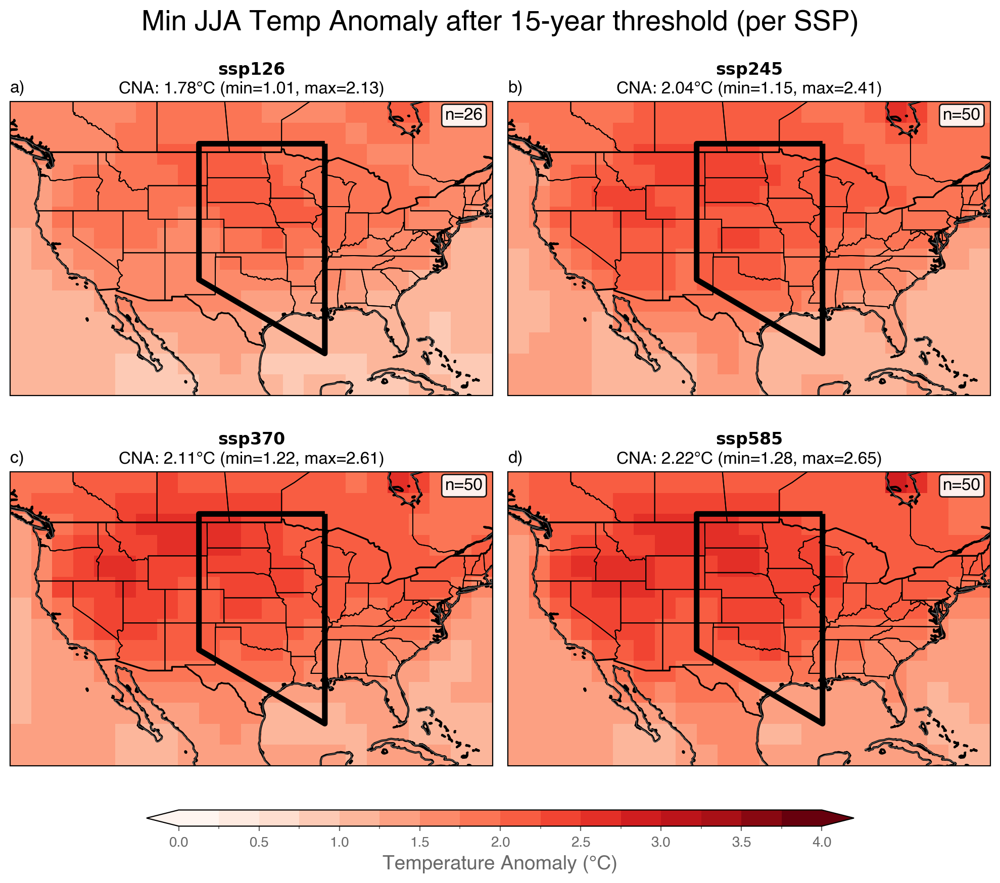

In [21]:
num_years = 15
temp_target = 2.0
lat_range = (20, 55)
lon_range = (233, 291)

analysis.plot_avg_temp_after_threshold_by_ssp(
    data_all,
    config_tf,
    num_years=num_years,
    temp_target=temp_target,
    lat_range=lat_range,
    lon_range=lon_range,
    vmin=0,
    vmax=4,
)

plt.savefig(
    f"{config_tf['figure_dir']}analysis/{config_tf['expname']}_slines_ann_mean_gn_{temp_target}_{num_years}yravg.png",
    dpi=300,
)

Skipping ACCESS-ESM1-5 member 3 in ssp126 due to year_reached=2100
Skipping ACCESS-ESM1-5 member 1 in ssp126 due to year_reached=2100
Skipping ACCESS-ESM1-5 member 7 in ssp126 due to year_reached=2100
Skipping ACCESS-ESM1-5 member 4 in ssp126 due to year_reached=2100
Skipping MIROC6 member 5 in ssp126 due to year_reached=2100
Skipping MIROC6 member 8 in ssp126 due to year_reached=2100
Skipping MIROC6 member 6 in ssp126 due to year_reached=2100
Skipping MIROC6 member 3 in ssp126 due to year_reached=2100
Skipping MIROC6 member 1 in ssp126 due to year_reached=2100
Skipping MIROC6 member 7 in ssp126 due to year_reached=2100
Skipping MIROC6 member 4 in ssp126 due to year_reached=2100
Skipping MPI-ESM1-2-LR member 8 in ssp126 due to year_reached=2100
Skipping MPI-ESM1-2-LR member 6 in ssp126 due to year_reached=2100
Skipping MPI-ESM1-2-LR member 3 in ssp126 due to year_reached=2100
Skipping MPI-ESM1-2-LR member 1 in ssp126 due to year_reached=2100
Skipping MPI-ESM1-2-LR member 7 in ssp126 du

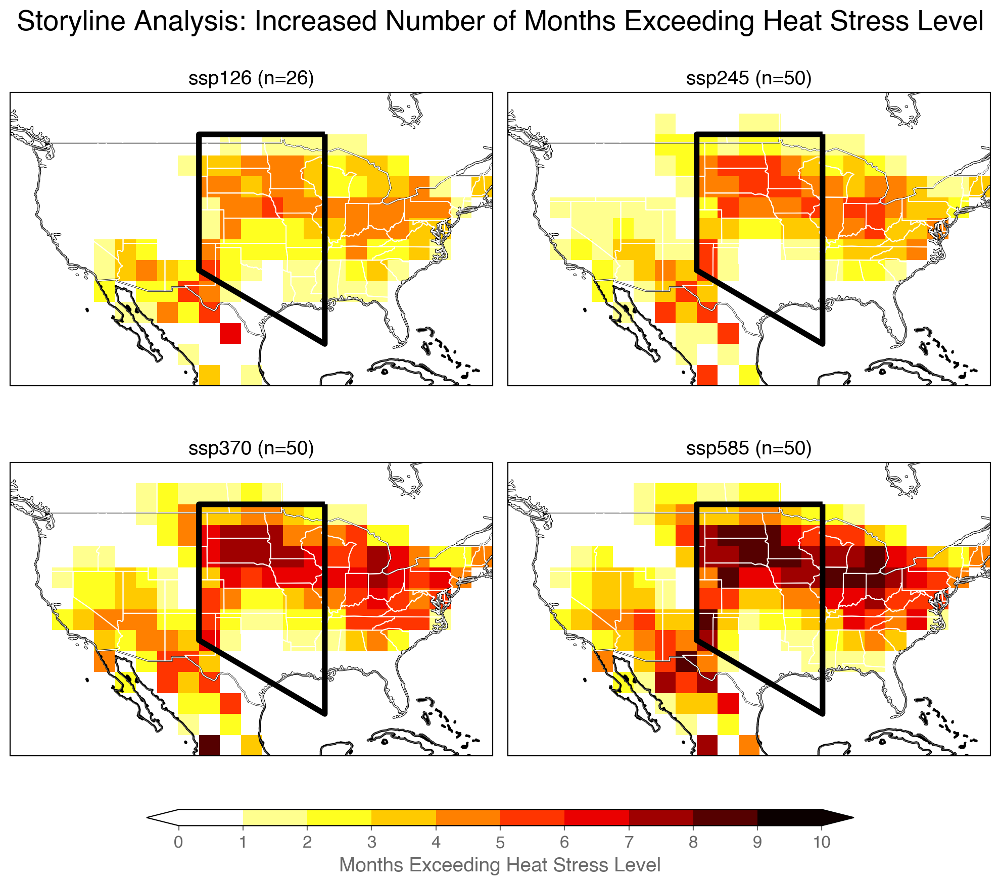

In [22]:
num_years = 15
#temp_target = 2.0
lat_range = (20, 55)
lon_range = (233, 291)

analysis.plot_avg_raw_temp_exceedance_change_window_by_ssp(
    data_all,
    config_tf,
    temp_target=temp_target,
    lat_range=lat_range,
    lon_range=lon_range,
    vmin=0,
    vmax=9,
)

In [23]:
selection_criteria_obs = "output_mode"  # Key for selection criteria for observations
selection_criteria_gcm = "y"  # Key for selection criteria for the GCM data
target_years = [2024]  # List of target years to analyze
temp_targets = [2.0]  # Temp targets to consider
# ssps = ["ssp585"]  # SSPs to analyze
ssps = ["ssp126", "ssp245", "ssp370", "ssp585"]

# Initialize the list to store storyline matches
storyline_matches = []

# Loop through SSPs and target years
for ssp in ssps:
    for year in target_years:
        for temp_target in temp_targets:
            # Filter observation data matching the SSP, year, and temp_target
            obs_values = [
                data.d_obs[selection_criteria_obs][i]
                for i, (y, ssp_obs, temp_target_obs) in enumerate(
                    zip(
                        data.d_obs["year"], data.d_obs["ssp"], data.d_obs["temp_target"]
                    )
                )
                if y == year and ssp_obs == ssp and temp_target_obs == temp_target
            ]

            if not obs_values:
                print(
                    f"No matching observations for SSP: {ssp}, Year: {year}, Temp Target: {temp_target}"
                )
                continue

            # Filter test data matching SSP, year, and temp_target
            test_indices = [
                i
                for i, (test_year, test_ssp, test_temp_target) in enumerate(
                    zip(
                        data_all["year"],
                        data_all["ssp"],
                        data_all["temp_target"],
                    )
                )
                if test_year == year
                and test_ssp == ssp
                and test_temp_target == temp_target
            ]

            if not test_indices:
                print(
                    f"No test data for SSP: {ssp}, Year: {year}, Temp Target: {temp_target}"
                )
                continue

            # Find the closest (e.g. absolute minimum value) b/w test index and corresponding obs_value
            # lambda function to find the closest match iterating over all combinations of test_indices and obs_values

            closest_test_index, closest_obs_value = min(
                ((i, obs) for i in test_indices for obs in obs_values),
                key=lambda x: abs(data_all[selection_criteria_gcm][x[0]] - x[1]),
            )

            # Append the match to storyline_matches
            storyline_matches.append(
                {
                    "ssp": ssp,
                    "year": year,
                    "temp_target": temp_target,
                    "obs_value": closest_obs_value,
                    "test_value": data_all[selection_criteria_gcm][closest_test_index],
                    "gcm_name": data_all["gcm_name"][closest_test_index],
                    "member": data_all["member"][closest_test_index],
                    "difference": abs(
                        data_all[selection_criteria_gcm][closest_test_index]
                        - closest_obs_value
                    ),
                }
            )

            # Print the result for debugging
            print(
                f"Year: {year}, SSP: {ssp}, Temp Target: {temp_target}, "
                f"Obs Value: {closest_obs_value:.4g}, "
                f"Test Value: {data_all[selection_criteria_gcm][closest_test_index]:.4g}, "
                f"GCM Name: {data_all['gcm_name'][closest_test_index]}, "
                f"Member: {data_all['member'][closest_test_index]}, "
                f"Difference: {abs(data_all[selection_criteria_gcm][closest_test_index] - closest_obs_value):.4g}"
            )

# Print all storyline matches
print("\nStoryline Matches:")
for match in storyline_matches:
    print(
        f"SSP: {match['ssp']}, Year: {match['year']}, Temp Target: {match['temp_target']}, "
        f"Obs Prediction: {match['obs_value']:.4g}, Test Prediction: {match['test_value']:.4g}, "
        f"GCM Name: {match['gcm_name']}, Member: {match['member']}, "
        f"Difference: {match['difference']:.4g}"
    )

Year: 2024, SSP: ssp126, Temp Target: 2.0, Obs Value: 21.55, Test Value: 24, GCM Name: ACCESS-CM2, Member: 6, Difference: 2.454
Year: 2024, SSP: ssp245, Temp Target: 2.0, Obs Value: 18.43, Test Value: 18, GCM Name: ACCESS-CM2, Member: 1, Difference: 0.4324
Year: 2024, SSP: ssp370, Temp Target: 2.0, Obs Value: 16.04, Test Value: 16, GCM Name: ACCESS-ESM1-5, Member: 9, Difference: 0.04233
Year: 2024, SSP: ssp585, Temp Target: 2.0, Obs Value: 14.06, Test Value: 14, GCM Name: MPI-ESM1-2-LR, Member: 1, Difference: 0.06145

Storyline Matches:
SSP: ssp126, Year: 2024, Temp Target: 2.0, Obs Prediction: 21.55, Test Prediction: 24, GCM Name: ACCESS-CM2, Member: 6, Difference: 2.454
SSP: ssp245, Year: 2024, Temp Target: 2.0, Obs Prediction: 18.43, Test Prediction: 18, GCM Name: ACCESS-CM2, Member: 1, Difference: 0.4324
SSP: ssp370, Year: 2024, Temp Target: 2.0, Obs Prediction: 16.04, Test Prediction: 16, GCM Name: ACCESS-ESM1-5, Member: 9, Difference: 0.04233
SSP: ssp585, Year: 2024, Temp Target:

In [24]:
data_all[selection_criteria_gcm]  # [closest_test_index]
temp_target

2.0

Computing anomalies with reference to baseline_yr_bounds then anomaly_yr_bounds.
Computing anomalies with reference to baseline_yr_bounds then anomaly_yr_bounds.
Computing anomalies with reference to baseline_yr_bounds then anomaly_yr_bounds.
Computing anomalies with reference to baseline_yr_bounds then anomaly_yr_bounds.


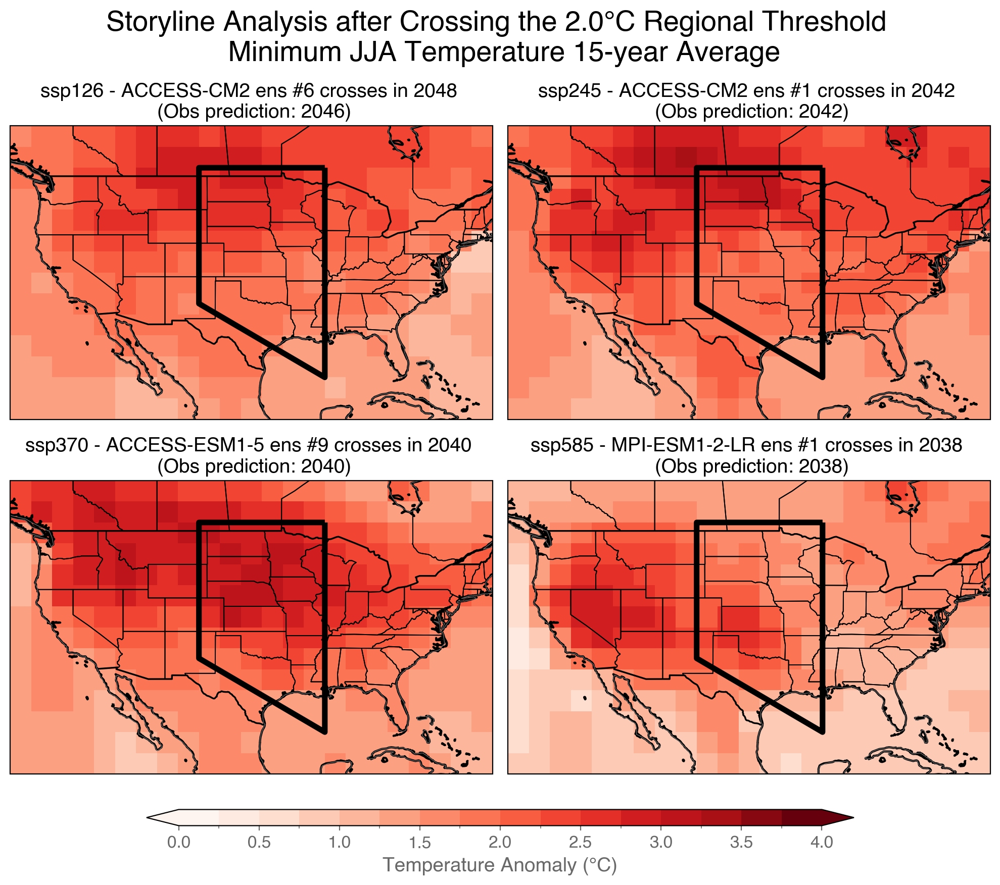

In [25]:
# Define latitude and longitude ranges for North America
lat_range = (20, 55)
lon_range = (233, 291)
num_years = 15

# Call the function with separate data variables
analysis.plot_multiple_storylines_min_temp(
    storyline_matches,
    data_all,
    data.d_obs,
    config_tf,
    seed=seed,
    num_years=num_years,
    lat_range=lat_range,
    lon_range=lon_range,
    vmin=0,
    vmax=4,
)

plt.savefig(
    f"{config_tf['figure_dir']}analysis/{config_tf['expname']}_slines_minJJA_{temp_target}_{num_years}yravg_transferlearn.png",
    dpi=300,
)

Computing anomalies with reference to baseline_yr_bounds then anomaly_yr_bounds.
Computing anomalies with reference to baseline_yr_bounds then anomaly_yr_bounds.
Computing anomalies with reference to baseline_yr_bounds then anomaly_yr_bounds.
Computing anomalies with reference to baseline_yr_bounds then anomaly_yr_bounds.


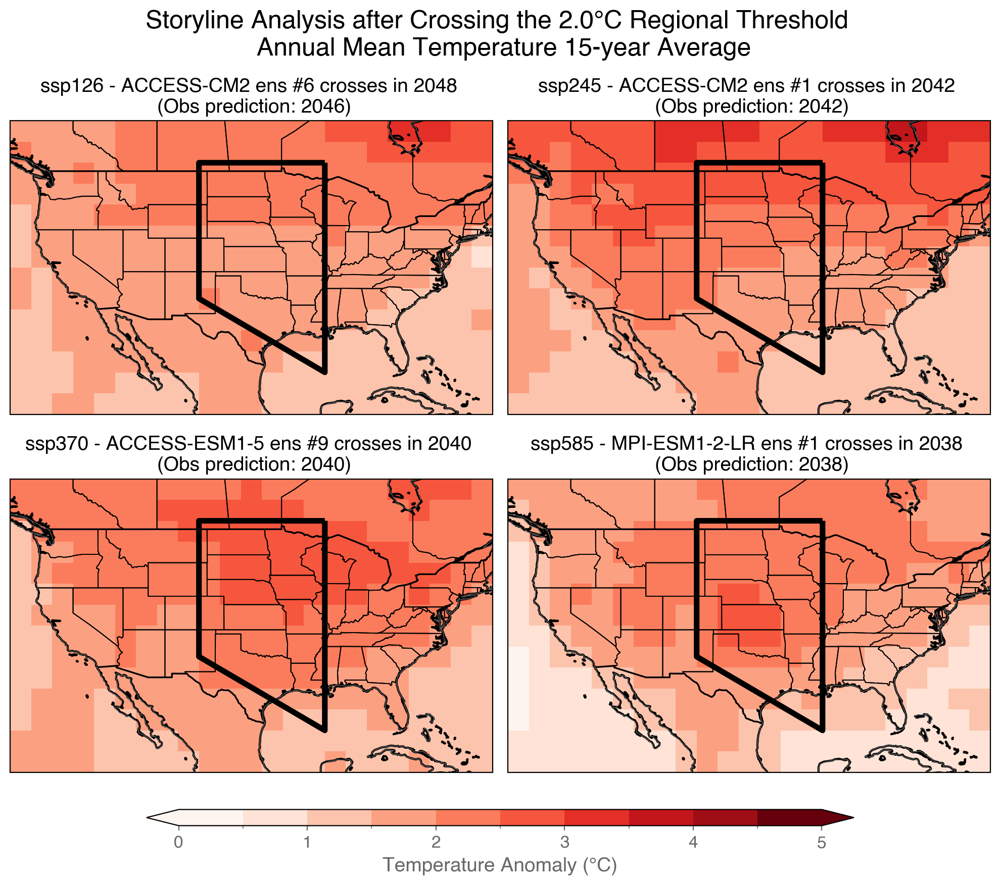

In [26]:
# Storyline for Annual Temperature
num_years = 15

analysis.plot_multiple_storylines_ann_temp(
    storyline_matches,
    data_all,
    data.d_obs,
    config_tf,
    seed=seed,
    num_years=num_years,
    lat_range=lat_range,
    lon_range=lon_range,
    vmin=0,
    vmax=5,
)

plt.savefig(
    f"{config_tf['figure_dir']}analysis/{config_tf['expname']}_slines_ann_mean_gn_{temp_target}_{num_years}yravg.png",
    dpi=300,
)

Computing anomalies with reference to baseline_yr_bounds then anomaly_yr_bounds.
Computing anomalies with reference to baseline_yr_bounds then anomaly_yr_bounds.
Computing anomalies with reference to baseline_yr_bounds then anomaly_yr_bounds.
Computing anomalies with reference to baseline_yr_bounds then anomaly_yr_bounds.


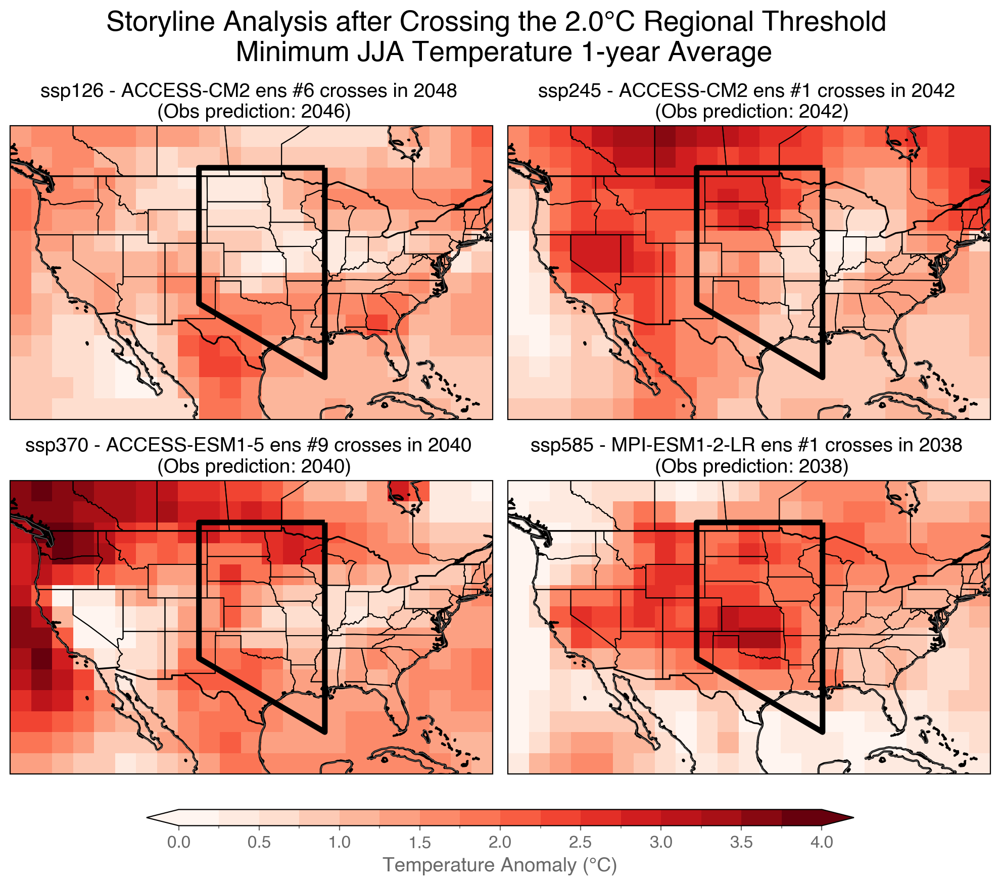

In [27]:
# Define latitude and longitude ranges for North America
# lat_range = (15, 70)
# lon_range = (215, 305)
lat_range = (20, 55)
lon_range = (233, 291)
num_years = 1

# Call the function with separate data variables
analysis.plot_multiple_storylines_min_temp(
    storyline_matches,
    data_all,
    data.d_obs,
    config_tf,
    seed=seed,
    num_years=num_years,
    lat_range=lat_range,
    lon_range=lon_range,
    vmin=0,
    vmax=4,
)

plt.savefig(
    f"{config_tf['figure_dir']}analysis/{config_tf['expname']}_slines_minJJA_{temp_target}_{num_years}yravg.png",
    dpi=300,
)

Computing anomalies with reference to baseline_yr_bounds then anomaly_yr_bounds.
Computing anomalies with reference to baseline_yr_bounds then anomaly_yr_bounds.
Computing anomalies with reference to baseline_yr_bounds then anomaly_yr_bounds.
Computing anomalies with reference to baseline_yr_bounds then anomaly_yr_bounds.


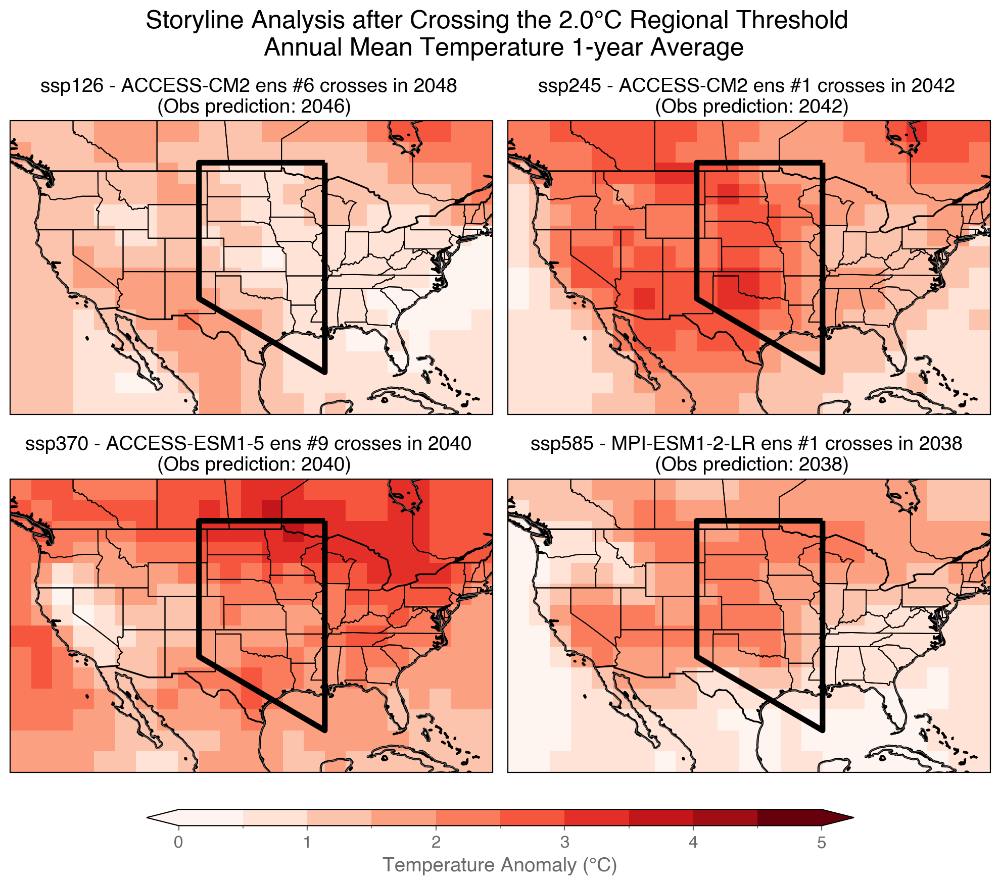

In [28]:
# Storyline for Annual Temperature
num_years = 1

analysis.plot_multiple_storylines_ann_temp(
    storyline_matches,
    data_all,
    data.d_obs,
    config_tf,
    seed=seed,
    num_years=num_years,
    lat_range=lat_range,
    lon_range=lon_range,
    vmin=0,
    vmax=5,
)

plt.savefig(
    f"{config_tf['figure_dir']}analysis/{config_tf['expname']}_slines_ann_mean_gn_{temp_target}_{num_years}yravg.png",
    dpi=300,
)

Computing anomalies with reference to baseline_yr_bounds then anomaly_yr_bounds.
Computing anomalies with reference to baseline_yr_bounds then anomaly_yr_bounds.
Computing anomalies with reference to baseline_yr_bounds then anomaly_yr_bounds.
Computing anomalies with reference to baseline_yr_bounds then anomaly_yr_bounds.


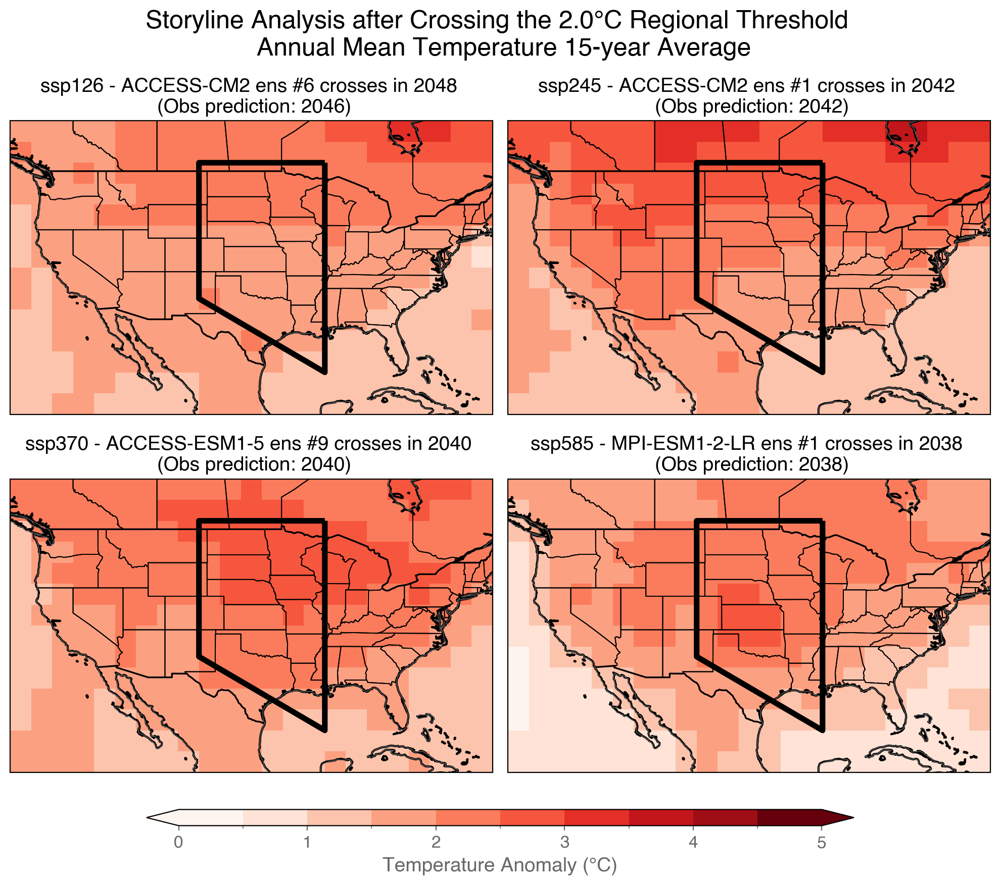

In [29]:
# Storyline for Annual Temperature
num_years = 15

analysis.plot_multiple_storylines_ann_temp(
    storyline_matches,
    data_all,
    data.d_obs,
    config_tf,
    seed=seed,
    num_years=num_years,
    lat_range=lat_range,
    lon_range=lon_range,
    vmin=0,
    vmax=4,
)

plt.savefig(
    f"{config_tf['figure_dir']}analysis/{config_tf['expname']}_slines_ann_mean_gn_{temp_target}_{num_years}yravg.png",
    dpi=300,
)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


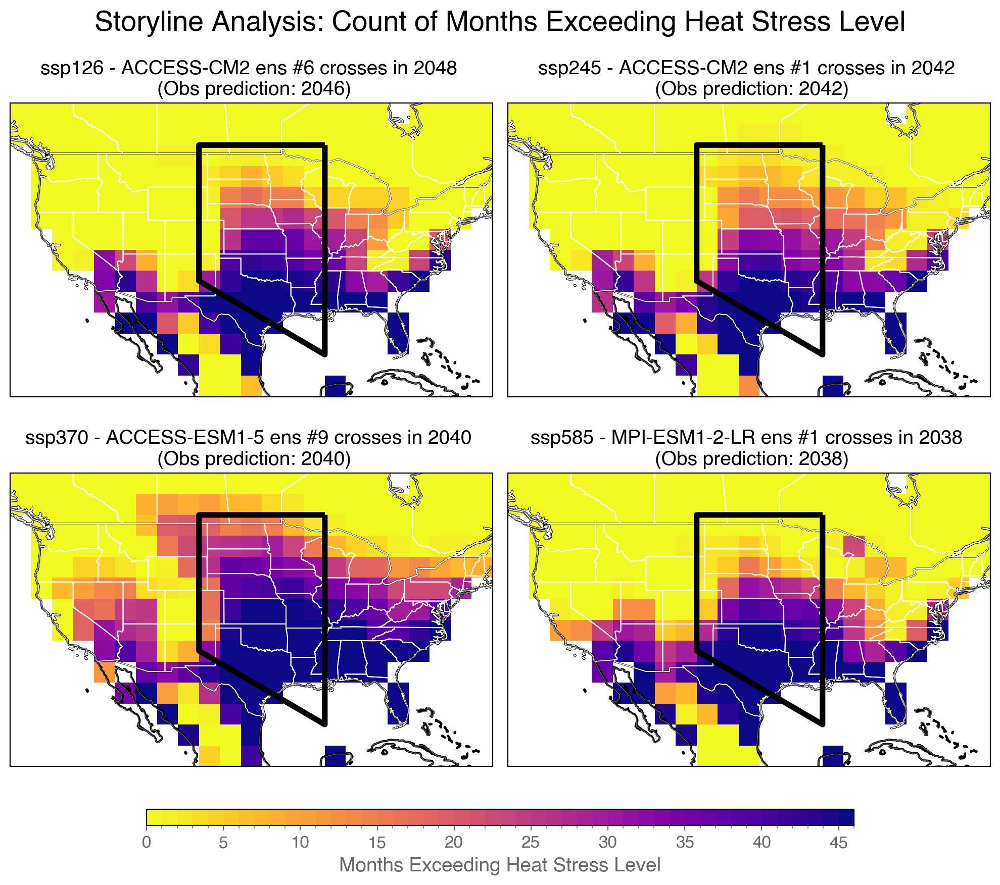

In [30]:
# If I need to reload modules after loading in data
%load_ext autoreload
%autoreload 2
%reload_ext autoreload

import analysis

# Storyline for Danger Days
num_years = 15

analysis.plot_raw_temp_exceedance_count(
    storyline_matches,
    data_all,
    data.d_obs,
    config_tf,
    seed=seed,
    num_years=num_years,
    lat_range=lat_range,
    lon_range=lon_range,
    vmin=0,
    vmax=45,
    save=True,
)

plt.savefig(
    f"{config_tf['figure_dir']}analysis/{config_tf['expname']}_raw_exceedance_{temp_target}_{num_years}yravg.png",
    dpi=300,
)

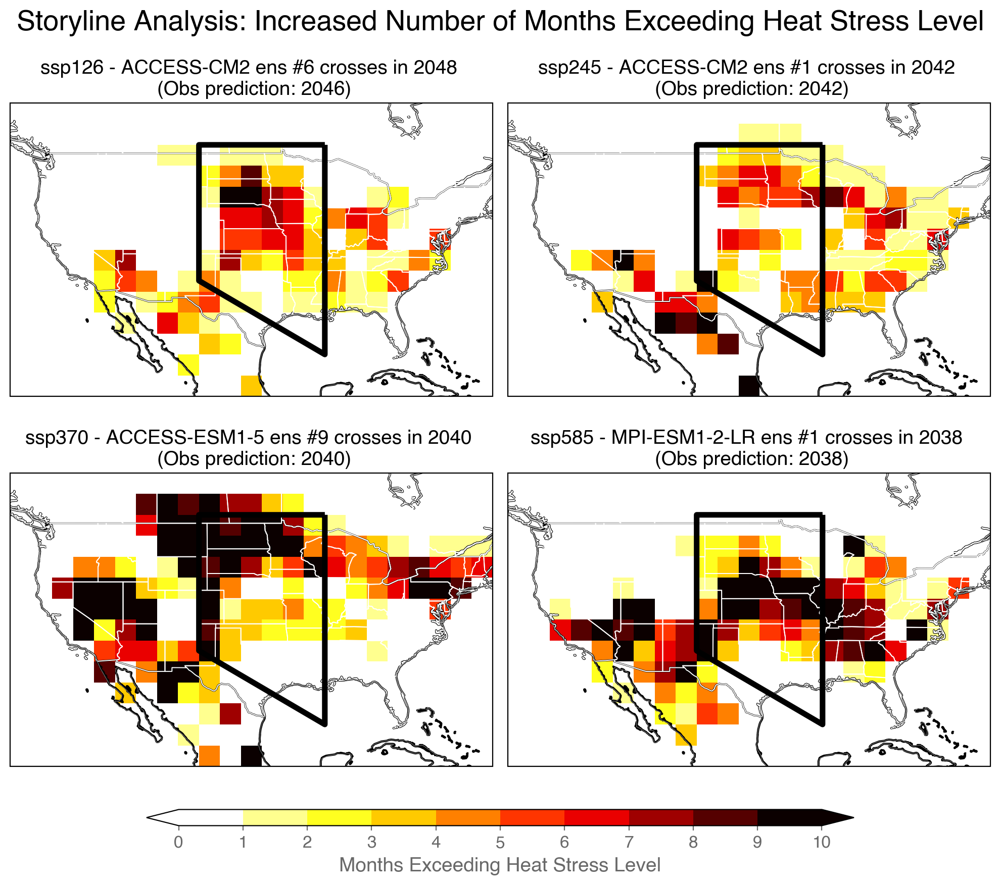

In [31]:
# Storyline for Danger Month Difference
num_years = 15

analysis.plot_raw_temp_exceedance_change_window(
    storyline_matches,
    data_all,
    data.d_obs,
    config_tf,
    seed=seed,
    lat_range=lat_range,
    lon_range=lon_range,
    vmin=0,
    vmax=9,
    save=True,
)

plt.savefig(
    f"{config_tf['figure_dir']}analysis/{config_tf['expname']}_raw_exceedance_{temp_target}_{num_years}yravg_increasedanger.png",
    dpi=300,
)

# Code added for revisions


--- CNA Increase Metrics for ssp126 - ACCESS-CM2 member 6 ---
Crossing year: 2048
Total CNA grid cells:                     50
CNA grid cells with INCREASE (>0 months):  37
CNA grid cells with DECREASE (<0 months):  0
CNA grid cells with NO CHANGE (==0):      13
Percent of CNA that increased:             74.00%
--------------------------------------------------------------

--- CNA Increase Metrics for ssp245 - ACCESS-CM2 member 1 ---
Crossing year: 2042
Total CNA grid cells:                     50
CNA grid cells with INCREASE (>0 months):  30
CNA grid cells with DECREASE (<0 months):  4
CNA grid cells with NO CHANGE (==0):      16
Percent of CNA that increased:             60.00%
--------------------------------------------------------------

--- CNA Increase Metrics for ssp370 - ACCESS-ESM1-5 member 9 ---
Crossing year: 2040
Total CNA grid cells:                     50
CNA grid cells with INCREASE (>0 months):  35
CNA grid cells with DECREASE (<0 months):  2
CNA grid cells with NO C

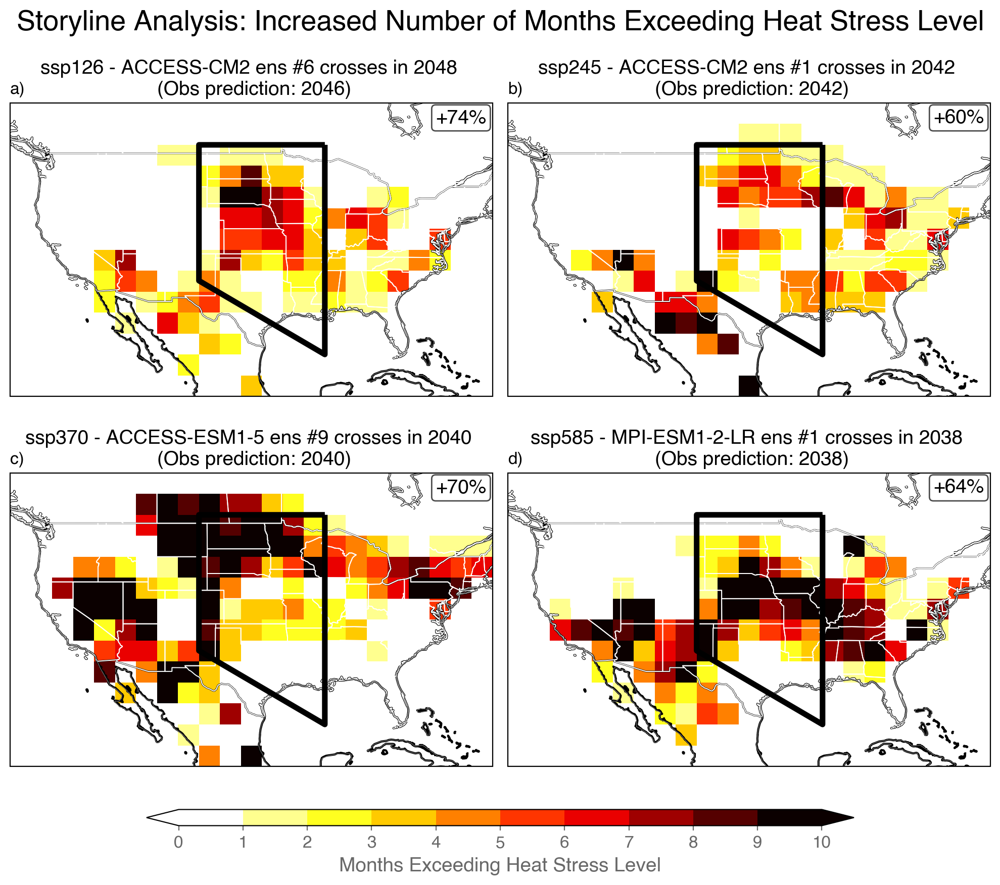

In [32]:
# Storyline for Danger Month Difference
num_years = 15

analysis.plot_raw_temp_exceedance_percent_change_window(
    storyline_matches,
    data_all,
    data.d_obs,
    config_tf,
    seed=seed,
    num_years=num_years,
    lat_range=lat_range,
    lon_range=lon_range,
    vmin=0,
    vmax=9,
    save=True,
)

# Analyze top closest matches


In [33]:
import heapq  # For finding the smallest differences

# General configuration
selection_criteria_obs = "output_mode"  # Key for selection criteria for observations
selection_criteria_gcm = "y"  # Key for selection criteria for the GCM data
target_years = [2024]  # List of target years to analyze
temp_targets = [2.0]  # Temp targets to consider
ssps = ["ssp245", "ssp370"]

# Top X closest matches
num_match = 5  # Number of closest matches

# Initialize the list to store storyline matches
closest_storyline_matches = []

# Loop through SSPs and target years
for ssp in ssps:
    for year in target_years:
        for temp_target in temp_targets:
            # Filter observation data matching the SSP, year, and temp_target
            obs_values = [
                data.d_obs[selection_criteria_obs][i]
                for i, (y, ssp_obs, temp_target_obs) in enumerate(
                    zip(
                        data.d_obs["year"], data.d_obs["ssp"], data.d_obs["temp_target"]
                    )
                )
                if y == year and ssp_obs == ssp and temp_target_obs == temp_target
            ]

            if not obs_values:
                print(
                    f"No matching observations for SSP: {ssp}, Year: {year}, Temp Target: {temp_target}"
                )
                continue

            # Filter test data matching SSP, year, and temp_target
            test_indices = [
                i
                for i, (test_year, test_ssp, test_temp_target) in enumerate(
                    zip(
                        data_all["year"],
                        data_all["ssp"],
                        data_all["temp_target"],
                    )
                )
                if test_year == year
                and test_ssp == ssp
                and test_temp_target == temp_target
            ]

            if not test_indices:
                print(
                    f"No test data for SSP: {ssp}, Year: {year}, Temp Target: {temp_target}"
                )
                continue

            # Find the top X closest (e.g. absolute minimum values) b/w test index and corresponding obs_value
            all_closest_matches = heapq.nsmallest(
                num_match,
                ((i, obs) for i in test_indices for obs in obs_values),
                key=lambda x: abs(
                    data_all[selection_criteria_gcm][x[0]] - x[1]
                ),  # Find the closest match
            )

            closest_matches = all_closest_matches[1:]

            # Store the top X closest matches
            for match in closest_matches:
                closest_test_index, closest_obs_value = match

                # Append the match to storyline_matches
                closest_storyline_matches.append(
                    {
                        "ssp": ssp,
                        "year": year,
                        "temp_target": temp_target,
                        "obs_value": closest_obs_value,
                        "test_value": data_all[selection_criteria_gcm][
                            closest_test_index
                        ],
                        "gcm_name": data_all["gcm_name"][closest_test_index],
                        "member": data_all["member"][closest_test_index],
                        "difference": abs(
                            data_all[selection_criteria_gcm][closest_test_index]
                            - closest_obs_value
                        ),
                    }
                )

                # Print the result for debugging
                print(
                    f"Year: {year}, SSP: {ssp}, Temp Target: {temp_target}, "
                    f"Obs Value: {closest_obs_value:.4g}, "
                    f"Test Value: {data_all[selection_criteria_gcm][closest_test_index]:.4g}, "
                    f"GCM Name: {data_all['gcm_name'][closest_test_index]}, "
                    f"Member: {data_all['member'][closest_test_index]}, "
                    f"Difference: {abs(data_all[selection_criteria_gcm][closest_test_index] - closest_obs_value):.4g}"
                )

# Print all storyline matches
print("\nStoryline Matches:")
for match in closest_storyline_matches:
    print(
        f"SSP: {match['ssp']}, Year: {match['year']}, Temp Target: {match['temp_target']}, "
        f"Obs Prediction: {match['obs_value']:.4g}, Test Prediction: {match['test_value']:.4g}, "
        f"GCM Name: {match['gcm_name']}, Member: {match['member']}, "
        f"Difference: {match['difference']:.4g}"
    )

Year: 2024, SSP: ssp245, Temp Target: 2.0, Obs Value: 18.43, Test Value: 19, GCM Name: MPI-ESM1-2-LR, Member: 1, Difference: 0.5676
Year: 2024, SSP: ssp245, Temp Target: 2.0, Obs Value: 18.43, Test Value: 20, GCM Name: MPI-ESM1-2-LR, Member: 7, Difference: 1.568
Year: 2024, SSP: ssp245, Temp Target: 2.0, Obs Value: 18.43, Test Value: 16, GCM Name: ACCESS-ESM1-5, Member: 6, Difference: 2.432
Year: 2024, SSP: ssp245, Temp Target: 2.0, Obs Value: 18.43, Test Value: 21, GCM Name: MIROC6, Member: 0, Difference: 2.568
Year: 2024, SSP: ssp370, Temp Target: 2.0, Obs Value: 16.04, Test Value: 17, GCM Name: MPI-ESM1-2-LR, Member: 1, Difference: 0.9577
Year: 2024, SSP: ssp370, Temp Target: 2.0, Obs Value: 16.04, Test Value: 15, GCM Name: MPI-ESM1-2-LR, Member: 8, Difference: 1.042
Year: 2024, SSP: ssp370, Temp Target: 2.0, Obs Value: 16.04, Test Value: 18, GCM Name: ACCESS-ESM1-5, Member: 7, Difference: 1.958
Year: 2024, SSP: ssp370, Temp Target: 2.0, Obs Value: 16.04, Test Value: 14, GCM Name: A

In [34]:
all_closest_matches  # [1:]

[(98901, 16.042334),
 (62359, 16.042334),
 (61996, 16.042334),
 (49775, 16.042334),
 (97570, 16.042334)]

In [35]:
# Specify the ssp you want to isolate
target_ssp = "ssp245"

# Filter storyline_matches for the specific ssp
filtered_storyline_matches = [
    match for match in closest_storyline_matches if match["ssp"] == target_ssp
]

# Print the filtered results
print(f"\nStoryline Matches for SSP: {target_ssp}")
for match in filtered_storyline_matches:
    print(
        f"SSP: {match['ssp']}, Year: {match['year']}, Temp Target: {match['temp_target']}, "
        f"Obs Prediction: {match['obs_value']:.4g}, Test Prediction: {match['test_value']:.4g}, "
        f"GCM Name: {match['gcm_name']}, Member: {match['member']}, "
        f"Difference: {match['difference']:.4g}"
    )


Storyline Matches for SSP: ssp245
SSP: ssp245, Year: 2024, Temp Target: 2.0, Obs Prediction: 18.43, Test Prediction: 19, GCM Name: MPI-ESM1-2-LR, Member: 1, Difference: 0.5676
SSP: ssp245, Year: 2024, Temp Target: 2.0, Obs Prediction: 18.43, Test Prediction: 20, GCM Name: MPI-ESM1-2-LR, Member: 7, Difference: 1.568
SSP: ssp245, Year: 2024, Temp Target: 2.0, Obs Prediction: 18.43, Test Prediction: 16, GCM Name: ACCESS-ESM1-5, Member: 6, Difference: 2.432
SSP: ssp245, Year: 2024, Temp Target: 2.0, Obs Prediction: 18.43, Test Prediction: 21, GCM Name: MIROC6, Member: 0, Difference: 2.568


Computing anomalies with reference to baseline_yr_bounds then anomaly_yr_bounds.
Computing anomalies with reference to baseline_yr_bounds then anomaly_yr_bounds.
Computing anomalies with reference to baseline_yr_bounds then anomaly_yr_bounds.
Computing anomalies with reference to baseline_yr_bounds then anomaly_yr_bounds.


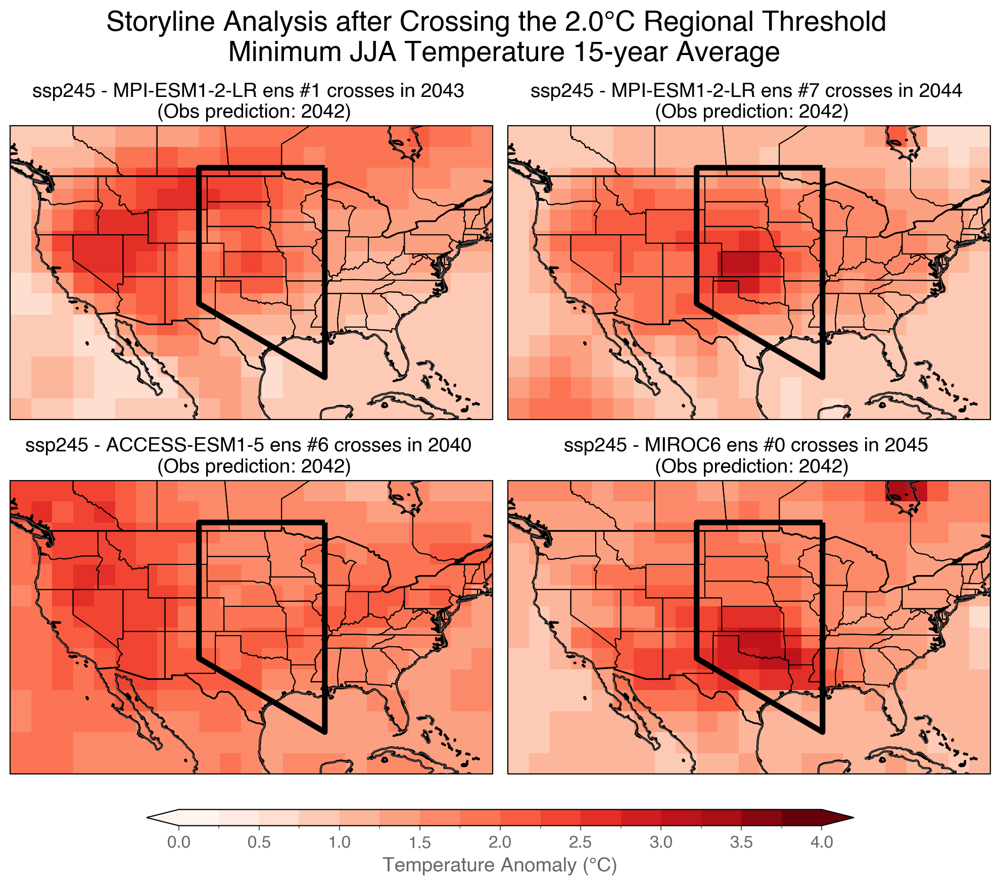

In [36]:
# Define latitude and longitude ranges for North America
lat_range = (20, 55)
lon_range = (233, 291)
num_years = 15

# Call the function with separate data variables
analysis.plot_multiple_storylines_min_temp(
    filtered_storyline_matches,
    data_all,
    data.d_obs,
    config_tf,
    seed=seed,
    num_years=num_years,
    lat_range=lat_range,
    lon_range=lon_range,
    vmin=0,
    vmax=4,
    save=False,
)

plt.savefig(
    f"{config_tf['figure_dir']}analysis/{config_tf['expname']}_closest_slines_minJJA_{ssp}_{temp_target}_{num_years}yravg.png",
    dpi=300,
)


--- CNA Increase Metrics for ssp245 - MPI-ESM1-2-LR member 1 ---
Crossing year: 2043
Total CNA grid cells:                     50
CNA grid cells with INCREASE (>0 months):  34
CNA grid cells with DECREASE (<0 months):  3
CNA grid cells with NO CHANGE (==0):      13
Percent of CNA that increased:             68.00%
--------------------------------------------------------------

--- CNA Increase Metrics for ssp245 - MPI-ESM1-2-LR member 7 ---
Crossing year: 2044
Total CNA grid cells:                     50
CNA grid cells with INCREASE (>0 months):  23
CNA grid cells with DECREASE (<0 months):  10
CNA grid cells with NO CHANGE (==0):      17
Percent of CNA that increased:             46.00%
--------------------------------------------------------------

--- CNA Increase Metrics for ssp245 - ACCESS-ESM1-5 member 6 ---
Crossing year: 2040
Total CNA grid cells:                     50
CNA grid cells with INCREASE (>0 months):  32
CNA grid cells with DECREASE (<0 months):  4
CNA grid cells wi

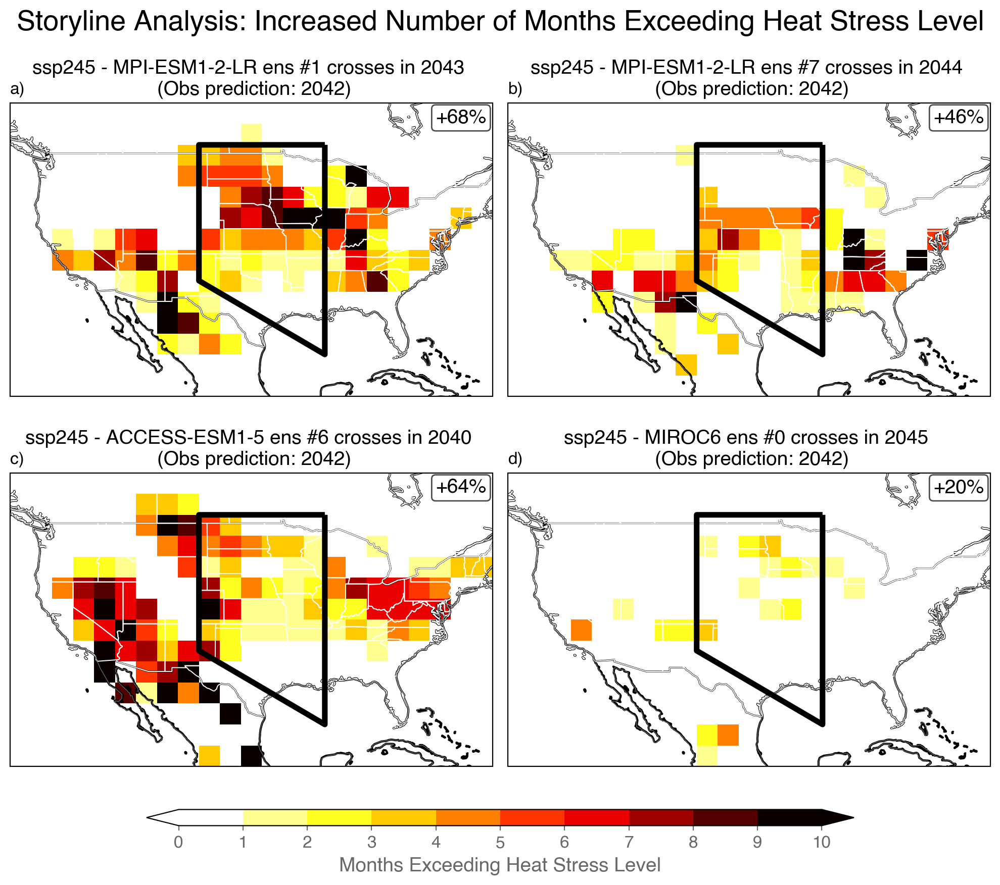

In [37]:
# Storyline for Danger Month Difference
num_years = 15

analysis.plot_raw_temp_exceedance_percent_change_window(
    filtered_storyline_matches,
    data_all,
    data.d_obs,
    config_tf,
    seed=seed,
    num_years=num_years,
    lat_range=lat_range,
    lon_range=lon_range,
    vmin=0,
    vmax=9,
    save=True,
)

plt.savefig(
    f"{config_tf['figure_dir']}analysis/{config_tf['expname']}_raw_exceedance_perc-CNA_{temp_target}_{num_years}yravg_increasedanger_closest matches.png",
    dpi=300,
)

In [38]:
$$$$$$$$$$$$

SyntaxError: invalid syntax (1122697648.py, line 1)

# XAI


In [ ]:
from captum.attr import IntegratedGradients
from captum.attr import ShapleyValueSampling

In [ ]:
computer = "marcodia"

ddir_in_ref = "/Users/" + computer + "/Documents/Projects/temp_thresh_shash/data/"
reference_ds = xr.open_dataset(
    ddir_in_ref + "tas_Amon_historical_ssp245_CanESM5_r1i1p1f1_ann_mean_2pt5degree.nc"
)
reference_ds

In [ ]:
from matplotlib import cm
from matplotlib.colors import LinearSegmentedColormap
import cartopy.crs as ccrs


# Get the original bwr colormap
orig_cmap = cm.get_cmap("bwr_r")


# Create new colormap with more white near zero
def custom_colormap(orig_cmap, stretch_center=0.2, n=256):
    """Return a modified colormap that concentrates white around zero."""
    # Generate n linearly spaced values between 0 and 1
    x = np.linspace(0, 1, n)
    # Apply nonlinear stretching: more density near 0.5
    stretched = 0.5 + (x - 0.5) * (abs(x - 0.5) / 0.5) ** stretch_center
    new_colors = orig_cmap(stretched)
    return LinearSegmentedColormap.from_list("custom_bwr", new_colors)


custom_bwr = custom_colormap(orig_cmap, stretch_center=0.4)

# Integrated Gradients

In [ ]:
# Plot Integrated Gradients for all temp targets and ssps averaged together

# Temp targets that haven't been reached in OBS
temp_target_values = [2.0]
years_of_interest = np.arange(2000, 2025)
ssp_plot_all = ["ssp126", "ssp245", "ssp370", "ssp585"]

# Initialize accumulation variables
sum_ig = None
count_ig = 0

for i, ssp_plot in enumerate(ssp_plot_all):
    for j, temp_target in enumerate(temp_target_values):

        # Filter data for the current temp_target and SSP
        filtered_indices = [
            k
            for k, (tt, year, ssp) in enumerate(
                zip(data.d_obs["temp_target"], data.d_obs["year"], data.d_obs["ssp"])
            )
            if tt == temp_target and year in years_of_interest and ssp == ssp_plot
        ]
        # print(f"{ssp_plot} | {temp_target}: {filtered_indices}")

        if not filtered_indices:
            continue  # Skip if no data points

        input_x = np.moveaxis(data.d_obs["x"], -1, 1)[filtered_indices]
        input_x_thresh = np.asarray(data.d_obs["temp_target"], dtype=input_x.dtype)[
            filtered_indices
        ]
        input_x_co2 = np.asarray(data.d_obs["emissions_left"], dtype=input_x.dtype)[
            filtered_indices
        ]

        _ = model_base.to("cpu")
        ig = IntegratedGradients(model_base)
        attributions, delta = ig.attribute(
            (
                torch.tensor(input_x),
                torch.tensor(input_x_thresh),
                torch.tensor(input_x_co2),
            ),
            (
                torch.tensor(input_x * 0),
                torch.tensor(input_x_thresh),
                torch.tensor(input_x_co2),
            ),
            target=0,
            return_convergence_delta=True,
            n_steps=200,
        )

        print(attributions[0].shape)

        # Unpack the attributions
        attr_map, attr_thresh, attr_co2 = attributions

        # Compute total attribution per sample
        total_attr_sum = (
            attr_map.view(attr_map.size(0), -1).sum(dim=1)
            + attr_thresh.view(-1)
            + attr_co2.view(-1)
        )

        # Compute model outputs
        input_tensor = (
            torch.tensor(input_x),
            torch.tensor(input_x_thresh),
            torch.tensor(input_x_co2),
        )
        baseline_tensor = (
            torch.zeros_like(torch.tensor(input_x)),  # Baseline = 0 map
            torch.tensor(input_x_thresh),
            torch.tensor(input_x_co2),
        )

        output_input = model_base(*input_tensor)
        output_baseline = model_base(*baseline_tensor)
        pred_diff = output_input - output_baseline

        # Compare sums to prediction difference
        # print("Sum of IG attributions:", total_attr_sum.detach().numpy())
        # print("Prediction difference: ", pred_diff.detach().numpy())
        print("Delta (should be small):", delta.detach().numpy())
        # print("Error in IG sum check:", (total_attr_sum - pred_diff).abs().max().item())

        # Get spatial IG attribution, mean over samples
        ig_map = attributions[0][:, 0, :, :].mean(axis=0)

        # Accumulate
        if sum_ig is None:
            sum_ig = ig_map
        else:
            sum_ig += ig_map
        count_ig += 1

# === Final Averaging and Plotting ===
if count_ig > 0:
    avg_ig_map = (sum_ig / count_ig) * 10  # Scale if needed
    fig, ax = plt.subplots(
        figsize=(7, 4),
        dpi=150,
        subplot_kw={"projection": ccrs.EqualEarth(central_longitude=0.0)},
    )

    cb, _ = plots.drawOnGlobe(
        ax,
        ax.projection,
        data=avg_ig_map,
        lats=data.lat,
        lons=data.lon,
        fastBool=True,
        cmap=custom_bwr,
        vmin=-0.5,
        vmax=0.5,
        cbarBool=True,
        extent="both",
    )
    ax.set_title("Base Model", fontsize=16)
    plt.tight_layout()
    plt.show()
else:
    print("No IG maps to average — check your filters.")

In [ ]:
# Plot Integrated Gradients for all temp targets and ssps averaged together

# Temp targets that haven't been reached in OBS
temp_target_values = [2.0]
years_of_interest = np.arange(2000, 2025)
ssp_plot_all = ["ssp126", "ssp245", "ssp370", "ssp585"]

# Initialize accumulation variables
sum_ig = None
count_ig = 0
sum_ig_tf = None
count_ig_tf = 0

for i, ssp_plot in enumerate(ssp_plot_all):
    for j, temp_target in enumerate(temp_target_values):

        # Filter data for the current temp_target and SSP
        filtered_indices = [
            k
            for k, (tt, year, ssp) in enumerate(
                zip(data.d_obs["temp_target"], data.d_obs["year"], data.d_obs["ssp"])
            )
            if tt == temp_target and year in years_of_interest and ssp == ssp_plot
        ]
        # print(f"{ssp_plot} | {temp_target}: {filtered_indices}")

        if not filtered_indices:
            continue  # Skip if no data points

        input_x = np.moveaxis(data.d_obs["x"], -1, 1)[filtered_indices]
        input_x_thresh = np.asarray(data.d_obs["temp_target"], dtype=input_x.dtype)[
            filtered_indices
        ]
        input_x_co2 = np.asarray(data.d_obs["emissions_left"], dtype=input_x.dtype)[
            filtered_indices
        ]

        _ = model_base.to("cpu")
        ig = IntegratedGradients(model_base)
        attributions, delta = ig.attribute(
            (
                torch.tensor(input_x),
                torch.tensor(input_x_thresh),
                torch.tensor(input_x_co2),
            ),
            (
                torch.tensor(input_x * 0),
                torch.tensor(input_x_thresh),
                torch.tensor(input_x_co2),
            ),
            target=0,
            return_convergence_delta=True,
            n_steps=500,
        )

        print(attributions[0].shape)
        # Report mean absolute error
        # Get spatial IG attribution, mean over samples
        ig_map_base = attributions[0][:, 0, :, :].mean(axis=0)

        # Accumulate
        if sum_ig is None:
            sum_ig = ig_map_base
        else:
            sum_ig += ig_map_base
        count_ig += 1

        _ = model_tf.to("cpu")
        ig = IntegratedGradients(model_tf)
        attributions_tf, delta = ig.attribute(
            (
                torch.tensor(input_x),
                torch.tensor(input_x_thresh),
                torch.tensor(input_x_co2),
            ),
            (
                torch.tensor(input_x * 0),
                torch.tensor(input_x_thresh),
                torch.tensor(input_x_co2),
            ),
            target=0,
            return_convergence_delta=True,
            n_steps=200,
        )

        # Report mean absolute error
        # Get spatial IG attribution, mean over samples
        ig_map_tf = attributions_tf[0][:, 0, :, :].mean(axis=0)

        # Accumulate
        if sum_ig_tf is None:
            sum_ig_tf = ig_map_tf
        else:
            sum_ig_tf += ig_map_tf
        count_ig_tf += 1

# === Final Averaging and Plotting ===
if count_ig > 0:
    avg_ig_map_base = (sum_ig / count_ig) * 10  # Scale if needed
    avg_ig_map_tf = (sum_ig_tf / count_ig_tf) * 10  # Scale if needed
    difference = avg_ig_map_tf - avg_ig_map_base
    fig, ax = plt.subplots(
        figsize=(7, 4),
        dpi=150,
        subplot_kw={"projection": ccrs.EqualEarth(central_longitude=0.0)},
    )

    cb, _ = plots.drawOnGlobe(
        ax,
        ax.projection,
        data=difference,
        lats=data.lat,
        lons=data.lon,
        fastBool=True,
        cmap=custom_bwr,
        vmin=-0.1,
        vmax=0.1,
        cbarBool=True,
        extent="both",
    )
    ax.set_title("Difference between transfer and base\nCNN models", fontsize=16)
    plt.tight_layout()
    plt.show()
else:
    print("No IG maps to average — check your filters.")

In [ ]:
# SINGLE IG MAP

# Temp targets that haven't been reached in OBS
temp_target_values = [2.0]
years_of_interest = np.arange(
    1980, 2025
)  # [2020, 2021, 2022, 2023, 2024]  # Years for SHASH predictions
ssp_plot_all = ["ssp126", "ssp245", "ssp370", "ssp585"]  # All SSPs to plot
# ssp_plot_all = ["ssp126", "ssp245", "ssp370", "ssp585"]  # All SSPs to plot
# Create the grid of subplots: Rows = SSPs, Columns = Temp Targets
fig, axs = plt.subplots(
    len(ssp_plot_all),
    len(temp_target_values),
    figsize=(5 * len(temp_target_values), 3 * len(ssp_plot_all)),
    dpi=150,
    subplot_kw={"projection": ccrs.EqualEarth(central_longitude=0.0)},
)

# Ensure axs is always a 2D array for consistent indexing
if len(temp_target_values) == 1:
    axs = axs[:, np.newaxis]
if len(ssp_plot_all) == 1:
    axs = axs[np.newaxis, :]

for i, ssp_plot in enumerate(ssp_plot_all):  # Loop through SSPs (rows)
    for j, temp_target in enumerate(
        temp_target_values
    ):  # Loop through temp_targets (columns)
        # if j > 0:
        ax = axs[i, j]  # Select the correct subplot
        # else:
        #    ax = axs[i]

        # Filter data for the current temp_target and SSP
        filtered_indices = [
            k
            for k, (tt, year, ssp) in enumerate(
                zip(data.d_obs["temp_target"], data.d_obs["year"], data.d_obs["ssp"])
            )
            if tt == temp_target and year in years_of_interest and ssp == ssp_plot
        ]
        print(filtered_indices)

        input_x = np.moveaxis(data.d_obs["x"], -1, 1)[filtered_indices]
        input_x_thresh = np.asarray(data.d_obs["temp_target"], dtype=input_x.dtype)[
            filtered_indices
        ]
        input_x_co2 = np.asarray(data.d_obs["emissions_left"], dtype=input_x.dtype)[
            filtered_indices
        ]

        _ = model_tf.to("cpu")
        ig = IntegratedGradients(model_tf)
        attributions, delta = ig.attribute(
            (
                torch.tensor(input_x).to("cpu"),
                torch.tensor(input_x_thresh).to("cpu"),
                torch.tensor(input_x_co2).to("cpu"),
            ),  # add to this line extra input node; convert to tensor
            (
                torch.tensor(input_x * 0).to("cpu"),
                torch.tensor(input_x_thresh).to("cpu"),
                torch.tensor(input_x_co2).to("cpu"),
            ),  # needs to be a tensor- baseline; don't want any attributions to the threshold or emissions; keep these as values that they are
            target=0,
            return_convergence_delta=True,
        )

        print("Convergence Delta:", delta)
        print(
            "Attributions for input_x_co2 and input_x_thresh",
            attributions[1],
            attributions[2],
        )  # this attributions index may need to change depending on order
        print(attributions[0].shape)
        # MAKE THE PLOT
        xplot = attributions[0][:, 0, :, :].mean(axis=0) * 10

        # Plot on the given subplot axis
        cb, _ = plots.drawOnGlobe(
            ax,
            ax.projection,
            data=xplot,
            lats=data.lat,
            lons=data.lon,
            fastBool=True,
            cmap=custom_bwr,
            vmin=-0.5,
            vmax=0.5,
            cbarBool=True,
            extent="both",
        )

        ax.set_title(f"{ssp_plot} | {temp_target}°C", fontsize=10)

# Optional: Set a main title and save
plt.suptitle("Integrated Gradients Attribution Maps", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.97])  # leave space for suptitle
plt.subplots_adjust(hspace=0.1)  # Reduce vertical spacing between rows

# Save or show
# plt.savefig("path_to_save/your_figure.png", dpi=300)
plt.show()

In [ ]:
# Temp targets that haven't been reached in OBS
temp_target_values = [2.0]
years_of_interest = np.arange(
    2000, 2025
)  # [2020, 2021, 2022, 2023, 2024]  # Years for SHASH predictions
ssp_plot_all = ["ssp126", "ssp245", "ssp370", "ssp585"]  # All SSPs to plot
# ssp_plot_all = ["ssp126", "ssp245", "ssp370", "ssp585"]  # All SSPs to plot
# Create the grid of subplots: Rows = SSPs, Columns = Temp Targets
fig, axs = plt.subplots(
    len(ssp_plot_all),
    len(temp_target_values),
    figsize=(5 * len(temp_target_values), 3 * len(ssp_plot_all)),
    dpi=150,
    subplot_kw={"projection": ccrs.EqualEarth(central_longitude=0.0)},
)

# Ensure axs is always a 2D array for consistent indexing
if len(temp_target_values) == 1:
    axs = axs[:, np.newaxis]
if len(ssp_plot_all) == 1:
    axs = axs[np.newaxis, :]

for i, ssp_plot in enumerate(ssp_plot_all):  # Loop through SSPs (rows)
    for j, temp_target in enumerate(
        temp_target_values
    ):  # Loop through temp_targets (columns)
        # if j > 0:
        ax = axs[i, j]  # Select the correct subplot
        # else:
        #    ax = axs[i]

        # Filter data for the current temp_target and SSP
        filtered_indices = [
            k
            for k, (tt, year, ssp) in enumerate(
                zip(data.d_obs["temp_target"], data.d_obs["year"], data.d_obs["ssp"])
            )
            if tt == temp_target and year in years_of_interest and ssp == ssp_plot
        ]
        print(filtered_indices)

        input_x = np.moveaxis(data.d_obs["x"], -1, 1)[filtered_indices]
        input_x_thresh = np.asarray(data.d_obs["temp_target"], dtype=input_x.dtype)[
            filtered_indices
        ]
        input_x_co2 = np.asarray(data.d_obs["emissions_left"], dtype=input_x.dtype)[
            filtered_indices
        ]

        _ = model_base.to("cpu")
        ig = IntegratedGradients(model_base)
        attributions_base, delta_base = ig.attribute(
            (
                torch.tensor(input_x).to("cpu"),
                torch.tensor(input_x_thresh).to("cpu"),
                torch.tensor(input_x_co2).to("cpu"),
            ),  # add to this line extra input node; convert to tensor
            (
                torch.tensor(input_x * 0).to("cpu"),
                torch.tensor(input_x_thresh).to("cpu"),
                torch.tensor(input_x_co2).to("cpu"),
            ),  # needs to be a tensor- baseline; don't want any attributions to the threshold or emissions; keep these as values that they are
            target=0,
            return_convergence_delta=True,
        )
        xplot_base = attributions_base[0][:, 0, :, :].mean(axis=0) * 10

        _ = model_tf.to("cpu")
        ig = IntegratedGradients(model_tf)
        attributions_tf, delta_tf = ig.attribute(
            (
                torch.tensor(input_x).to("cpu"),
                torch.tensor(input_x_thresh).to("cpu"),
                torch.tensor(input_x_co2).to("cpu"),
            ),  # add to this line extra input node; convert to tensor
            (
                torch.tensor(input_x * 0).to("cpu"),
                torch.tensor(input_x_thresh).to("cpu"),
                torch.tensor(input_x_co2).to("cpu"),
            ),  # needs to be a tensor- baseline; don't want any attributions to the threshold or emissions; keep these as values that they are
            target=0,
            return_convergence_delta=True,
        )

        xplot_tf = attributions_tf[0][:, 0, :, :].mean(axis=0) * 10

        difference = xplot_tf - xplot_base

        # Plot on the given subplot axis
        cb, _ = plots.drawOnGlobe(
            ax,
            ax.projection,
            data=difference,
            lats=data.lat,
            lons=data.lon,
            fastBool=True,
            cmap=custom_bwr,
            vmin=-0.25,
            vmax=0.25,
            cbarBool=True,
            extent="both",
        )

        ax.set_title(f"{ssp_plot} | {temp_target}°C", fontsize=10)

# Optional: Set a main title and save
plt.suptitle("Difference between Transfer and Base IG Maps", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.97])  # leave space for suptitle
plt.subplots_adjust(hspace=0.1)  # Reduce vertical spacing between rows

# Save or show
# plt.savefig("path_to_save/your_figure.png", dpi=300)
plt.show()

# SHAP

In [ ]:
# SINGLE SHAP PLOT

# Temp targets that haven't been reached in OBS
temp_target_values = [2.0]
years_of_interest = np.arange(
    2000, 2025
)  # [2020, 2021, 2022, 2023, 2024]  # Years for SHASH predictions
ssp_plot_all = ["ssp126", "ssp245", "ssp370", "ssp585"]  # All SSPs to plot
xplot = []
# ssp_plot_all = ["ssp126", "ssp245", "ssp370", "ssp585"]  # All SSPs to plot
# Create the grid of subplots: Rows = SSPs, Columns = Temp Targets
fig, axs = plt.subplots(
    len(ssp_plot_all),
    len(temp_target_values),
    figsize=(5 * len(temp_target_values), 3 * len(ssp_plot_all)),
    dpi=150,
    subplot_kw={"projection": ccrs.EqualEarth(central_longitude=0.0)},
)

# Ensure axs is always a 2D array for consistent indexing
if len(temp_target_values) == 1:
    axs = axs[:, np.newaxis]
if len(ssp_plot_all) == 1:
    axs = axs[np.newaxis, :]

for i, ssp_plot in enumerate(ssp_plot_all):  # Loop through SSPs (rows)
    for j, temp_target in enumerate(
        temp_target_values
    ):  # Loop through temp_targets (columns)
        # if j > 0:
        ax = axs[i, j]  # Select the correct subplot
        # else:
        #    ax = axs[i]

        # Filter data for the current temp_target and SSP
        filtered_indices = [
            k
            for k, (tt, year, ssp) in enumerate(
                zip(data.d_obs["temp_target"], data.d_obs["year"], data.d_obs["ssp"])
            )
            if tt == temp_target and year in years_of_interest and ssp == ssp_plot
        ]
        print(filtered_indices)

        input_x = np.moveaxis(data.d_obs["x"], -1, 1)[filtered_indices]
        input_x_thresh = np.asarray(data.d_obs["temp_target"], dtype=input_x.dtype)[
            filtered_indices
        ]
        input_x_co2 = np.asarray(data.d_obs["emissions_left"], dtype=input_x.dtype)[
            filtered_indices
        ]

        _ = model_tf.to("cpu")
        svs = ShapleyValueSampling(model_tf)
        attr = svs.attribute(
            (
                torch.tensor(input_x).to("cpu"),
                torch.tensor(input_x_thresh).to("cpu"),
                torch.tensor(input_x_co2).to("cpu"),
            ),
            target=0,
            n_samples=1,
        )
        print(attr[0].shape)
        # MAKE THE PLOT
        xplot[i] = attr[0][:, 0, :, :].mean(axis=0) * 100

        # Plot on the given subplot axis
        cb, _ = plots.drawOnGlobe(
            ax,
            ax.projection,
            data=xplot,
            lats=data.lat,
            lons=data.lon,
            fastBool=True,
            cmap=custom_bwr,
            vmin=-1.5,
            vmax=1.5,
            cbarBool=True,
            extent="both",
        )

        ax.set_title(f"{ssp_plot} | {temp_target}°C", fontsize=10)

# Optional: Set a main title and save
plt.suptitle("SHAPLEY Maps", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.97])  # leave space for suptitle
plt.subplots_adjust(hspace=0.1)  # Reduce vertical spacing between rows

# Save or show
# plt.savefig("path_to_save/your_figure.png", dpi=300)
plt.show()

In [ ]:
# Temp targets that haven't been reached in OBS
temp_target_values = [2.0]
years_of_interest = np.arange(
    2000, 2025
)  # [2020, 2021, 2022, 2023, 2024]  # Years for SHASH predictions
ssp_plot_all = ["ssp126", "ssp245", "ssp370", "ssp585"]  # All SSPs to plot
# ssp_plot_all = ["ssp126", "ssp245", "ssp370", "ssp585"]  # All SSPs to plot
# Create the grid of subplots: Rows = SSPs, Columns = Temp Targets
fig, axs = plt.subplots(
    len(ssp_plot_all),
    len(temp_target_values),
    figsize=(5 * len(temp_target_values), 3 * len(ssp_plot_all)),
    dpi=150,
    subplot_kw={"projection": ccrs.EqualEarth(central_longitude=0.0)},
)

# Ensure axs is always a 2D array for consistent indexing
if len(temp_target_values) == 1:
    axs = axs[:, np.newaxis]
if len(ssp_plot_all) == 1:
    axs = axs[np.newaxis, :]

for i, ssp_plot in enumerate(ssp_plot_all):  # Loop through SSPs (rows)
    for j, temp_target in enumerate(
        temp_target_values
    ):  # Loop through temp_targets (columns)
        # if j > 0:
        ax = axs[i, j]  # Select the correct subplot
        # else:
        #    ax = axs[i]

        # Filter data for the current temp_target and SSP
        filtered_indices = [
            k
            for k, (tt, year, ssp) in enumerate(
                zip(data.d_obs["temp_target"], data.d_obs["year"], data.d_obs["ssp"])
            )
            if tt == temp_target and year in years_of_interest and ssp == ssp_plot
        ]
        print(filtered_indices)

        input_x = np.moveaxis(data.d_obs["x"], -1, 1)[filtered_indices]
        input_x_thresh = np.asarray(data.d_obs["temp_target"], dtype=input_x.dtype)[
            filtered_indices
        ]
        input_x_co2 = np.asarray(data.d_obs["emissions_left"], dtype=input_x.dtype)[
            filtered_indices
        ]

        _ = model_base.to("cpu")
        svs = ShapleyValueSampling(model_base)
        attr_base = svs.attribute(
            (
                torch.tensor(input_x).to("cpu"),
                torch.tensor(input_x_thresh).to("cpu"),
                torch.tensor(input_x_co2).to("cpu"),
            ),
            target=0,
            n_samples=1,
        )
        xplot_base = attr_base[0][:, 0, :, :].mean(axis=0) * 10

        _ = model_tf.to("cpu")
        svs = ShapleyValueSampling(model_tf)
        attr_tf = svs.attribute(
            (
                torch.tensor(input_x).to("cpu"),
                torch.tensor(input_x_thresh).to("cpu"),
                torch.tensor(input_x_co2).to("cpu"),
            ),
            target=0,
            n_samples=1,
        )

        xplot_tf = attr_tf[0][:, 0, :, :].mean(axis=0) * 10

        difference = xplot_tf - xplot_base

        # Plot on the given subplot axis
        cb, _ = plots.drawOnGlobe(
            ax,
            ax.projection,
            data=difference,
            lats=data.lat,
            lons=data.lon,
            fastBool=True,
            cmap=custom_bwr,
            vmin=-0.5,
            vmax=0.5,
            cbarBool=True,
            extent="both",
        )

        ax.set_title(f"{ssp_plot} | {temp_target}°C", fontsize=10)

# Optional: Set a main title and save
plt.suptitle("Difference between Transfer and Base IG Maps", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.97])  # leave space for suptitle
plt.subplots_adjust(hspace=0.1)  # Reduce vertical spacing between rows

# Save or show
# plt.savefig("path_to_save/your_figure.png", dpi=300)
plt.show()

In [ ]:
xplot
fig, ax = plt.subplots(
    1,
    1,
    figsize=(5, 3),
    dpi=150,
    subplot_kw={"projection": ccrs.EqualEarth(central_longitude=0.0)},
)
cb, _ = plots.drawOnGlobe(
    ax,
    ax.projection,
    data=difference,
    lats=data.lat,
    lons=data.lon,
    fastBool=True,
    cmap=custom_bwr,
    vmin=-2.0,
    vmax=2.0,
    cbarBool=True,
    extent="both",
)
plt.show()

# Predict with a Zeros Map to assess baseline output

In [ ]:
data.d_obs["x"] = data.d_obs["x"] * 0
data.d_obs["year"]

In [ ]:
# SINGLE IG MAP

# Temp targets that haven't been reached in OBS
temp_target_values = [1.0, 2.0]
years_of_interest = np.arange(
    1980, 2025
)  # [2020, 2021, 2022, 2023, 2024]  # Years for SHASH predictions
ssp_plot_all = ["ssp126", "ssp245", "ssp370", "ssp585"]  # All SSPs to plot
# ssp_plot_all = ["ssp126", "ssp245", "ssp370", "ssp585"]  # All SSPs to plot
# Create the grid of subplots: Rows = SSPs, Columns = Temp Targets
fig, axs = plt.subplots(
    len(ssp_plot_all),
    len(temp_target_values),
    figsize=(5 * len(temp_target_values), 3 * len(ssp_plot_all)),
    dpi=150,
    subplot_kw={"projection": ccrs.EqualEarth(central_longitude=0.0)},
)

# Ensure axs is always a 2D array for consistent indexing
if len(temp_target_values) == 1:
    axs = axs[:, np.newaxis]
if len(ssp_plot_all) == 1:
    axs = axs[np.newaxis, :]

for i, ssp_plot in enumerate(ssp_plot_all):  # Loop through SSPs (rows)
    for j, temp_target in enumerate(
        temp_target_values
    ):  # Loop through temp_targets (columns)
        # if j > 0:
        ax = axs[i, j]  # Select the correct subplot
        # else:
        #    ax = axs[i]

        # Filter data for the current temp_target and SSP
        filtered_indices = [
            k
            for k, (tt, year, ssp) in enumerate(
                zip(data.d_obs["temp_target"], data.d_obs["year"], data.d_obs["ssp"])
            )
            if tt == temp_target and year in years_of_interest and ssp == ssp_plot
        ]
        print(filtered_indices)

        input_x = np.moveaxis(data.d_obs["x"], -1, 1)[filtered_indices]
        input_x_thresh = np.asarray(data.d_obs["temp_target"], dtype=input_x.dtype)[
            filtered_indices
        ]
        input_x_co2 = np.asarray(data.d_obs["emissions_left"], dtype=input_x.dtype)[
            filtered_indices
        ]

        _ = model_tf.to("cpu")
        ig = IntegratedGradients(model_tf)
        attributions, delta = ig.attribute(
            (
                torch.tensor(input_x).to("cpu"),
                torch.tensor(input_x_thresh).to("cpu"),
                torch.tensor(input_x_co2).to("cpu"),
            ),  # add to this line extra input node; convert to tensor
            (
                torch.tensor(input_x * 0).to("cpu"),
                torch.tensor(input_x_thresh).to("cpu"),
                torch.tensor(input_x_co2).to("cpu"),
            ),  # needs to be a tensor- baseline; don't want any attributions to the threshold or emissions; keep these as values that they are
            target=0,
            return_convergence_delta=True,
        )

        print("Convergence Delta:", delta)
        print(
            "Attributions for input_x_co2 and input_x_thresh",
            attributions[1],
            attributions[2],
        )  # this attributions index may need to change depending on order
        print(attributions[0].shape)
        # MAKE THE PLOT
        xplot = attributions[0][:, 0, :, :].mean(axis=0) * 10

        # Plot on the given subplot axis
        cb, _ = plots.drawOnGlobe(
            ax,
            ax.projection,
            data=xplot,
            lats=data.lat,
            lons=data.lon,
            fastBool=True,
            cmap=custom_bwr,
            vmin=-0.5,
            vmax=0.5,
            cbarBool=True,
            extent="both",
        )

        ax.set_title(f"{ssp_plot} | {temp_target}°C", fontsize=10)

# Optional: Set a main title and save
plt.suptitle("Integrated Gradients Attribution Maps", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.97])  # leave space for suptitle
plt.subplots_adjust(hspace=0.1)  # Reduce vertical spacing between rows

# Save or show
# plt.savefig("path_to_save/your_figure.png", dpi=300)
plt.show()

In [ ]:
obsset_zeros = data_loader.CustomData(data.d_obs)
obsset_zeros

In [ ]:
# with torch.inference_mode():  # inference mode disables gradient calculations for efficiency
data.d_obs["output_zero"] = model_base.predict(
    dataset=obsset_zeros, batch_size=128, device=device
)

In [ ]:
data.d_obs["output_median"] = Shash(data.d_obs["output_zero"]).median().numpy()
data.d_obs["output_lbar"] = Shash(data.d_obs["output_zero"]).quantile(0.25).numpy()
data.d_obs["output_hbar"] = Shash(data.d_obs["output_zero"]).quantile(0.75).numpy()

data.d_obs["output_mode"] = Shash(data.d_obs["output_zero"]).mode().numpy()
data.d_obs["output_mode_lbar"] = Shash(data.d_obs["output_zero"]).quantile(0.25).numpy()
data.d_obs["output_mode_hbar"] = Shash(data.d_obs["output_zero"]).quantile(0.75).numpy()

constraint_var = "output_median"

# Define colors for SSPs
colors = {
    "ssp126": "blue",
    "ssp245": "green",
    "ssp370": "orange",
    "ssp585": "red",
}

# Loop over temp_targets to create one plot for each
for temp_target in list(
    dict.fromkeys(data.d_obs["temp_target"])
):  # Unique temp_target values
    plt.figure(figsize=(4, 3))  # Create a new figure for each temp_target

    # Loop over SSPs to plot all lines for the current temp_target
    for ssp in list(dict.fromkeys(data.d_obs["ssp"])):  # Unique SSP values
        # Filter the dictionary to isolate data for the current SSP and temp_target
        indices = [
            i
            for i, (ssp_val, temp_tar) in enumerate(
                zip(data.d_obs["ssp"], data.d_obs["temp_target"])
            )
            if ssp_val == ssp and temp_tar == temp_target
        ]

        if not indices:  # Skip if no data matches the current combination
            continue

        # Extract relevant data for plotting
        years = [data.d_obs["year"][i] for i in indices]
        output_var = [data.d_obs[constraint_var][i] for i in indices]

        if constraint_var == "output_median":
            output_lbar = [data.d_obs["output_lbar"][i] for i in indices]
            output_hbar = [data.d_obs["output_hbar"][i] for i in indices]
            error_bars = np.concatenate(
                (
                    np.array(output_var) - np.array(output_lbar)[np.newaxis, :],
                    np.array(output_hbar)[np.newaxis, :] - np.array(output_var),
                ),
                axis=0,
            )
        else:
            output_lbar = [data.d_obs["output_mode_lbar"][i] for i in indices]
            output_hbar = [data.d_obs["output_mode_hbar"][i] for i in indices]
            # Compute error bars (ensure no negative values)
            lower_error = np.maximum(np.array(output_var) - np.array(output_lbar), 0)
            upper_error = np.maximum(np.array(output_hbar) - np.array(output_var), 0)

            # Make sure the error bars are in the shape of a 1D array
            error_bars = [lower_error, upper_error]

        # Plot the data with error bars
        plt.errorbar(
            years,
            np.array(output_var) + np.array(years),
            yerr=error_bars,
            color=colors[ssp],
            label=f"{ssp}",
        )

        # Plot the points
        plt.plot(
            years,
            np.array(output_var) + np.array(years),
            "o",
            markeredgecolor=colors[ssp],
            markersize=6,
            markerfacecolor="none",
            markeredgewidth=1,
        )

    # Set plot labels, legend, and limits
    plt.ylim(1970, 2120)
    plt.xlim(1979, 2025)
    plt.xlabel("Year of Input")
    plt.ylabel("Predicted Year Threshold is Reached")
    plt.title(f"{temp_target}C Threshold\n{model_name}")
    plt.legend(title="SSP", loc="best")
    plt.tight_layout()

    # plt.savefig(
    #     f"{config_tf['figure_dir']}analysis/{config_tf['expname']}_temp_target_timeseries_{temp_target}_seed{seed}_transferlearn.png",
    #     dpi=300,
    # )

    # Show the plot (or clear to start fresh for the next loop)
    plt.show()

In [ ]:
data.d_obs["output_zero"][0:45]

In [ ]:
data.d_obs["emissions_left"][0:45]

In [ ]:
# Temp targets that haven't been reached in OBS
temp_target_values = [1.0, 2.0, 3.0]
years_of_interest = [2020, 2021, 2022, 2023, 2024]  # Years for SHASH predictions
ssp_plot_all = ["ssp126", "ssp245", "ssp370", "ssp585"]  # All SSPs to plot

x = np.arange(-130, 130, 0.1)  # X-axis for SHASH PDF
f, axs = plt.subplots(
    len(ssp_plot_all), len(temp_target_values), figsize=(12, 16), dpi=200
)  # SSPs x temp_target
panel_letters = [
    "(a)",
    "(b)",
    "(c)",
    "(d)",
    "(e)",
    "(f)",
    "(g)",
    "(h)",
    "(i)",
    "(j)",
    "(k)",
    "(l)",
]
fontsize = 10

# Colorblind-friendly palette for years
color_palette = ["#0072B2", "#E69F00", "#009E73", "#D55E00", "#CC79A7"]

for i, ssp_plot in enumerate(ssp_plot_all):  # Loop through SSPs (rows)
    for j, temp_target in enumerate(
        temp_target_values
    ):  # Loop through temp_targets (columns)
        ax = axs[i, j]  # Select the correct subplot

        # Filter data for the current temp_target and SSP
        filtered_indices = [
            k
            for k, (tt, year, ssp) in enumerate(
                zip(data.d_obs["temp_target"], data.d_obs["year"], data.d_obs["ssp"])
            )
            if tt == temp_target and year in years_of_interest and ssp == ssp_plot
        ]

        if not filtered_indices:
            ax.text(
                0.5,
                0.5,
                "No data available",
                transform=ax.transAxes,
                fontsize=12,
                color="gray",
                ha="center",
                va="center",
            )
            continue

        # Plot SHASH curves for each year
        for color, year in zip(color_palette, years_of_interest):
            year_indices = [
                k for k in filtered_indices if data.d_obs["year"][k] == year
            ]

            if not year_indices:
                continue

            for sample in year_indices:
                dist = Shash(
                    data.d_obs["output"][sample : sample + 1, :]
                )  # SHASH for this sample
                p = dist.prob(x).numpy()
                ax.plot(
                    x
                    + data.d_obs["year"][sample],  # Shift x-axis by the prediction year
                    p,
                    zorder=1,
                    color=color,
                    linewidth=2,
                    label=f"{year}; Analysis yr: {data.d_obs[constraint_var][sample] + data.d_obs['year'][sample]:.1f}",
                )

        # Plot observations
        obs_indices = [
            k
            for k, (ssp_val, tt) in enumerate(
                zip(data.d_obs["ssp"], data.d_obs["temp_target"])
            )
            if ssp_val == ssp_plot and tt == temp_target
        ]

        if obs_indices:
            obs_index = obs_indices[0]
            obs_year = data.d_obs["y"][obs_index] + data.d_obs["year"][obs_index]
            gcm_name = data.d_obs["gcm_name"][obs_index]
            ax.axvline(
                x=obs_year,
                linestyle=":",
                color="black",
                alpha=1.0,
                linewidth=3,
                label=f"truth: {obs_year}; {gcm_name}",
                zorder=2,
            )
        else:
            ax.text(
                0.5,
                0.9,
                "truth: n/a",
                transform=ax.transAxes,
                fontsize=8,
                color="gray",
                ha="center",
            )

        # Customize subplot
        ax.set_title(
            panel_letters[i * 3 + j] + f" {ssp_plot}, temp threshold = {temp_target}",
            fontsize=fontsize,
            color="k",
        )

        ax.legend(
            fontsize=11, handlelength=2, frameon=True, loc="upper right", framealpha=1
        )
        ax.set_xlabel("Year threshold crossed", fontsize=fontsize)
        ax.set_xticks(np.arange(1980, 2110, 20))
        ax.set_xlim(1980, 2110)
        ax.set_ylim(-0.001, 0.08)

        ax.set_yticks([])
        ax.set_ylabel("pdf" if j == 0 else "")  # Y-label only for left column
        ax.grid(False)

plt.suptitle("SHASH Predictions for Observations", fontsize=16)
plt.tight_layout()
# plt.savefig(
#     f"{config_tf['figure_dir']}analysis/{config_tf['expname']}_shash_obs_based_seed{seed}_recentpreds_tflearn.png",
#     dpi=300,
# )
plt.show()